In this notebook, we analyze web development clients to segment them into different categories based on their service usage patterns. Conclusions from this segmentation can give us business insights and strategies for optimizing our web development service offerings.

##### Topics explored in the notebook

1) Importing required libraries and data
2) Simple visualization of the data and sample clients
3) Visualization via PCA and pairplot
4) Checking for dependent variables
5) Outlier detection and handling
6) Cluster analysis: Are there clusters, how many?
7) Clustering and interpretation
8) Deriving conclusions

### 1) Importing required libraries and data

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy as sc
import matplotlib as mpl

In [2]:
import itertools

In [3]:
data = pd.read_csv('order_segmentation.csv')

In [4]:
data.head()

,customer,project,total_hours,discount%,weekday,hour,num_projects,Frontend%,Backend%,UI/UX%,DevOps%,Maintenance%,Testing%,Consulting%,Security%,class,labels
0,0,0,52.0,29.12,4,14,5,35.8,5.7,25.9,7.2,0.0,9.5,8.2,7.6,1,frontend_specialists
1,1,1,43.0,20.44,4,18,1,24.4,6.7,5.7,13.6,27.6,13.4,8.7,0.0,3,maintenance_focused
2,2,2,55.0,20.39,5,9,5,14.8,28.3,9.7,0.0,9.0,9.1,9.9,19.1,0,general
3,3,3,68.0,7.82,2,10,4,24.2,21.3,15.3,9.6,11.2,6.8,0.0,11.6,0,general
4,4,4,41.0,29.15,7,18,2,18.9,21.9,10.9,9.1,16.0,4.3,11.2,7.6,0,general


### 2) Simple visualization

In [5]:
data.describe()

,customer,project,total_hours,discount%,weekday,hour,num_projects,Frontend%,Backend%,UI/UX%,DevOps%,Maintenance%,Testing%,Consulting%,Security%,class
count,28000.000000,28000.000000,28000.000000,28000.000000,28000.000000,28000.000000,28000.000000,28000.000000,28000.000000,28000.000000,28000.000000,28000.000000,28000.000000,28000.000000,28000.000000,28000.000000
mean,13999.500000,13999.500000,45.048679,15.075732,4.008143,14.519500,3.986179,19.965500,19.979136,10.030432,9.993879,10.059446,10.005171,10.011154,9.955761,0.293071
std,8083.048105,8083.048105,14.918011,7.793761,2.000055,4.046849,1.997674,6.432955,6.449882,6.008863,6.024026,6.002212,6.031447,6.009234,5.998213,1.144371
min,0.000000,0.000000,5.000000,0.000000,1.000000,8.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,6999.750000,6999.750000,35.000000,9.550000,2.000000,11.000000,2.000000,15.700000,15.700000,5.700000,5.600000,5.700000,5.600000,5.600000,5.600000,0.000000
50%,13999.500000,13999.500000,45.000000,15.010000,4.000000,15.000000,4.000000,19.800000,19.800000,9.900000,9.900000,10.000000,9.900000,9.900000,9.800000,0.000000
75%,20999.250000,20999.250000,55.000000,20.430000,6.000000,18.000000,6.000000,24.100000,24.100000,14.000000,14.100000,14.100000,14.100000,14.000000,14.000000,0.000000
max,27999.000000,27999.000000,100.000000,40.000000,7.000000,21.000000,7.000000,58.700000,66.100000,37.100000,37.800000,36.200000,46.200000,44.000000,39.600000,5.000000


1. customer - unique client ID
2. project - unique project ID
3. total_hours - total hours spent on the project
4. discount% - percentage discount provided on the project
5. weekday - day of the week when project was started
6. hour - hour when project was started
7. Frontend% - percentage of project hours spent on frontend development
8. Backend% - percentage of project hours spent on backend development
9. UI/UX% - percentage of project hours spent on UI/UX design
10. DevOps% - percentage of project hours spent on DevOps
11. Maintenance% - percentage of project hours spent on maintenance
12. Testing% - percentage of project hours spent on testing
13. Consulting% - percentage of project hours spent on consulting
14. Security% - percentage of project hours spent on security

In [6]:
data[data['discount%']<0].sort_values(by='discount%', ascending=True)

,customer,project,total_hours,discount%,weekday,hour,num_projects,Frontend%,Backend%,UI/UX%,DevOps%,Maintenance%,Testing%,Consulting%,Security%,class,labels


-> drinks% and negative discount are highly correlated, may be the company imposed a lot of inconvenience and transport charges on drinks.

#### Selecting samples

In [7]:
indices = [56,2459,908,23632,1803,218,592,349]
data.iloc[indices, :]

,customer,project,total_hours,discount%,weekday,hour,num_projects,Frontend%,Backend%,UI/UX%,DevOps%,Maintenance%,Testing%,Consulting%,Security%,class,labels
56,56,56,32.0,26.76,1,11,3,27.5,17.9,3.0,0.0,14.1,19.9,14.3,3.3,0,general
2459,2459,2459,52.0,14.54,6,19,2,15.1,16.6,9.3,10.1,20.5,19.5,6.7,2.2,0,general
908,908,908,55.0,20.65,4,20,1,10.4,18.4,11.9,6.3,20.7,15.8,9.3,7.3,0,general
23632,23632,23632,55.0,18.14,6,18,3,11.8,25.2,6.3,6.7,18.1,10.8,15.0,6.1,0,general
1803,1803,1803,22.0,14.33,5,19,6,16.9,20.6,13.5,14.2,11.8,10.8,6.9,5.4,0,general
218,218,218,38.0,19.95,3,16,1,26.8,33.8,6.7,6.1,9.9,8.1,4.0,4.5,0,general
592,592,592,52.0,7.28,7,9,5,16.4,27.4,7.0,0.0,17.9,24.3,0.0,7.0,0,general
349,349,349,42.0,13.89,5,18,4,27.8,16.0,6.7,11.2,13.4,2.2,8.1,14.6,0,general


- Client with high Frontend% and UI/UX% likely focuses on user interface projects
- Clients with high Backend% and DevOps% are probably building complex systems
- High Maintenance% suggests ongoing support contracts
- High Testing% and Security% indicates quality-focused enterprise clients
- High Consulting% might indicate strategic partnership clients

There may not be any relevant information in the hour in which the order was placed, but the weekday in which the order was placed may reveal some information about weekend buyers. Hece let's keep it.

Let's remove customer, order and hour features from the data

In [8]:
df = data.drop(['customer', 'project', 'hour'], axis=1)
frame = data


### 3) Visualization via pca and pairplot

Let's try and do pca of the features and see the explained variance and plots

In [9]:
from sklearn.decomposition import PCA

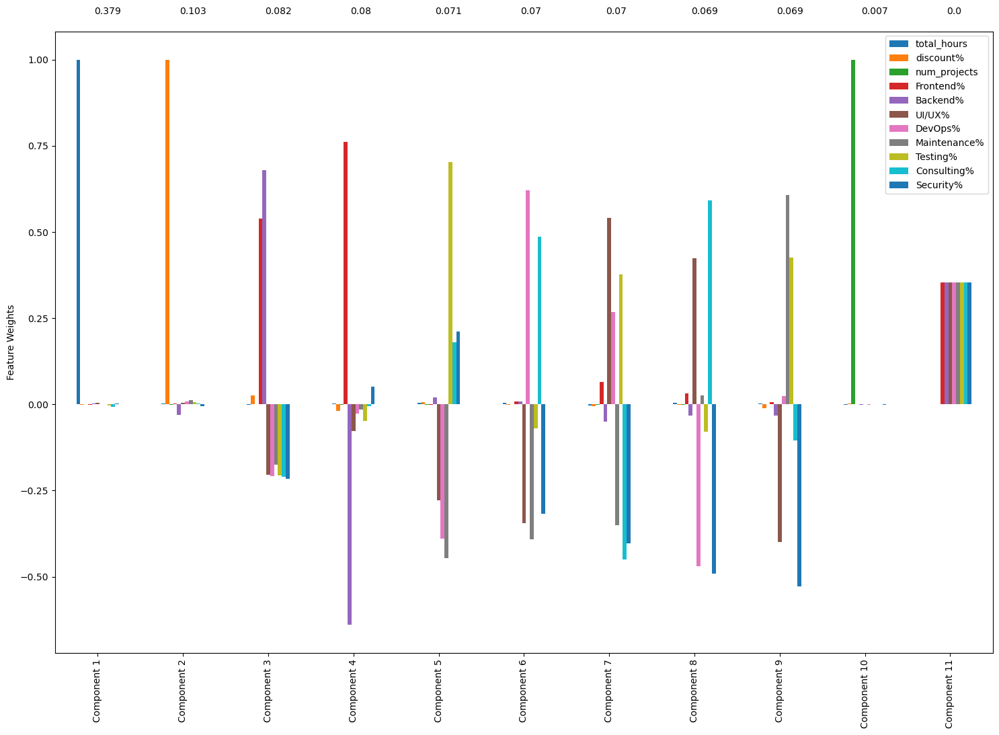

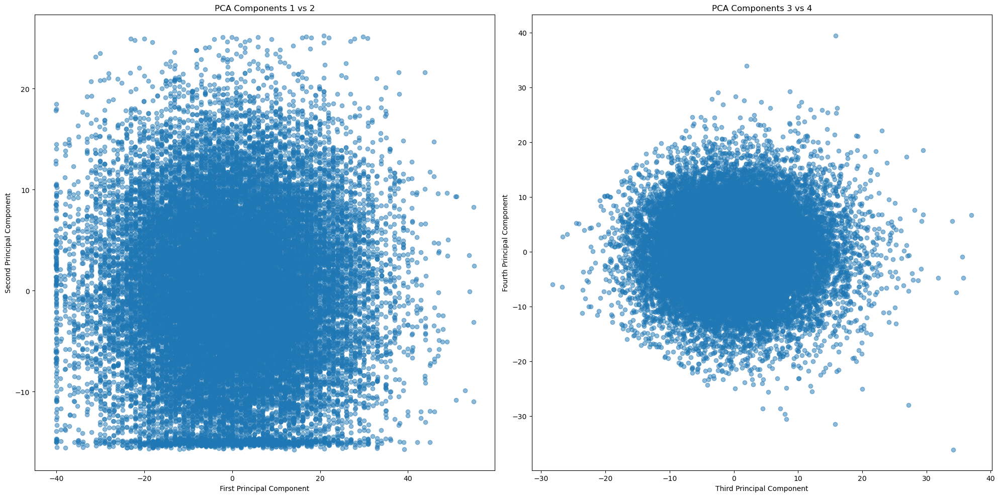

In [11]:
def pca_results(pca, df):
 
    dimensions = ['Component {}'.format(i) for i in range(1, pca.n_components_+1)]
    
    # Create the plot
    fig, ax = plt.subplots(figsize=(18,12))
    
    # Plot feature weights
    components = pd.DataFrame(pca.components_)
    components.plot(ax=ax, kind='bar')
    
    # Update labels
    labels = [str(s) for s in df.columns]
    ax.legend(labels)
    ax.set_ylabel('Feature Weights')
    ax.set_xticklabels(dimensions, rotation=90)
    
    # Add explained variance ratio
    for i, ev in enumerate(np.round(pca.explained_variance_ratio_, 3)):
        ax.text(i-0.04, ax.get_ylim()[1]+0.05, ev)
    
    plt.show()

def pca_2d_plot(pca, df):
    """
    Plot first four principal components in 2D scatter plots
    """
    fig = plt.figure(figsize=(20,10))
    transformed_data = pca.transform(df.values)
    data = pd.DataFrame(
        transformed_data, 
        columns=[f'dim{i+1}' for i in range(transformed_data.shape[1])]
    )
    
    # First subplot
    plt.subplot(1, 2, 1)
    plt.scatter(data['dim1'], data['dim2'], alpha=0.5)
    plt.xlabel('First Principal Component')
    plt.ylabel('Second Principal Component')
    plt.title('PCA Components 1 vs 2')
    
    # Second subplot
    plt.subplot(1, 2, 2)
    plt.scatter(data['dim3'], data['dim4'], alpha=0.5)
    plt.xlabel('Third Principal Component')
    plt.ylabel('Fourth Principal Component')
    plt.title('PCA Components 3 vs 4')
    
    plt.tight_layout()
    plt.show()

# Now run the PCA analysis
numerical_cols = ['total_hours', 'discount%', 'num_projects', 
                 'Frontend%', 'Backend%', 'UI/UX%', 'DevOps%',
                 'Maintenance%', 'Testing%', 'Consulting%', 'Security%']

# Create DataFrame with only numerical columns
df_numerical = df[numerical_cols]

# Perform PCA
pca = PCA(n_components=len(numerical_cols))
pca.fit(df_numerical.values)

# Visualize results
pca_results(pca, df_numerical)
pca_2d_plot(pca, df_numerical)

This function takes the pca object and data frame as argurments and plots the explained variance of every feature in each principal component.

In [12]:
def pca_results(pca, df):
    dimensions = ['dimention {}'.format(i) for i in range(1,pca.n_components_+1)]
    fig, ax = plt.subplots(figsize=(18,12))
    components = pd.DataFrame(pca.components_)
    components.plot(ax=ax, kind='bar');
    labels = [str(s) for s in df.columns]
    ax.legend(labels)
    ax.set_ylabel('Feature Weights')
    ax.set_xticklabels(dimensions, rotation=90)
    for i, ev in enumerate(np.round(pca.explained_variance_ratio_, 3)):
        ax.text(i-0.04, ax.get_ylim()[1]+0.05, ev)
    plt.show()

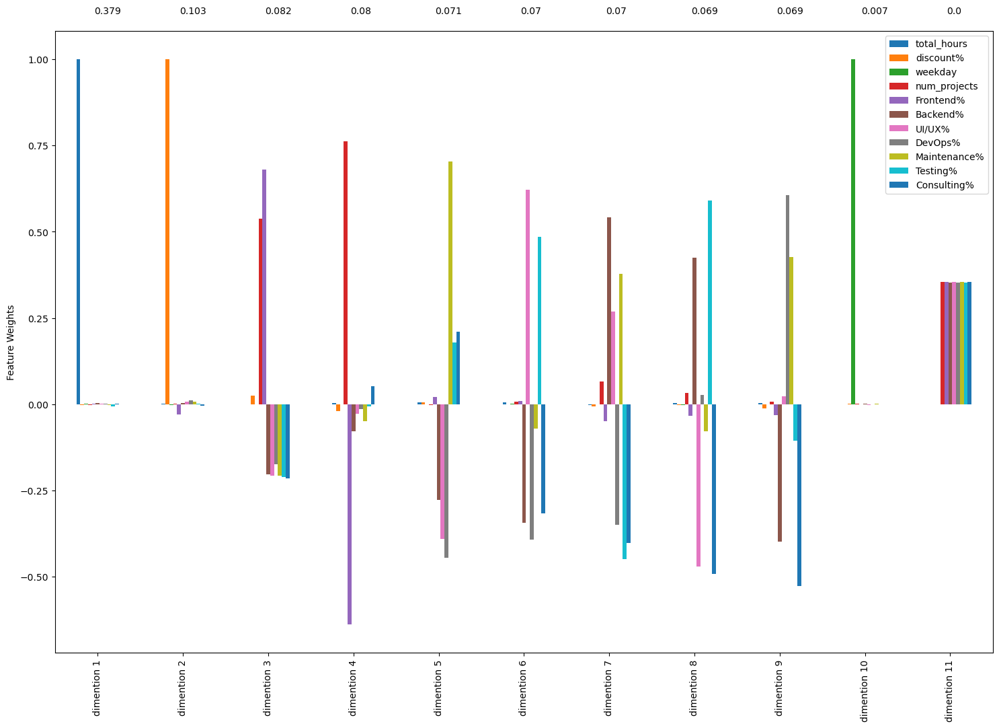

In [13]:
pca_results(pca, df)

This function accepts pca object and data frame as arguements and plots the scatter plot of first four principal components.

<Figure size 1000x1000 with 0 Axes>

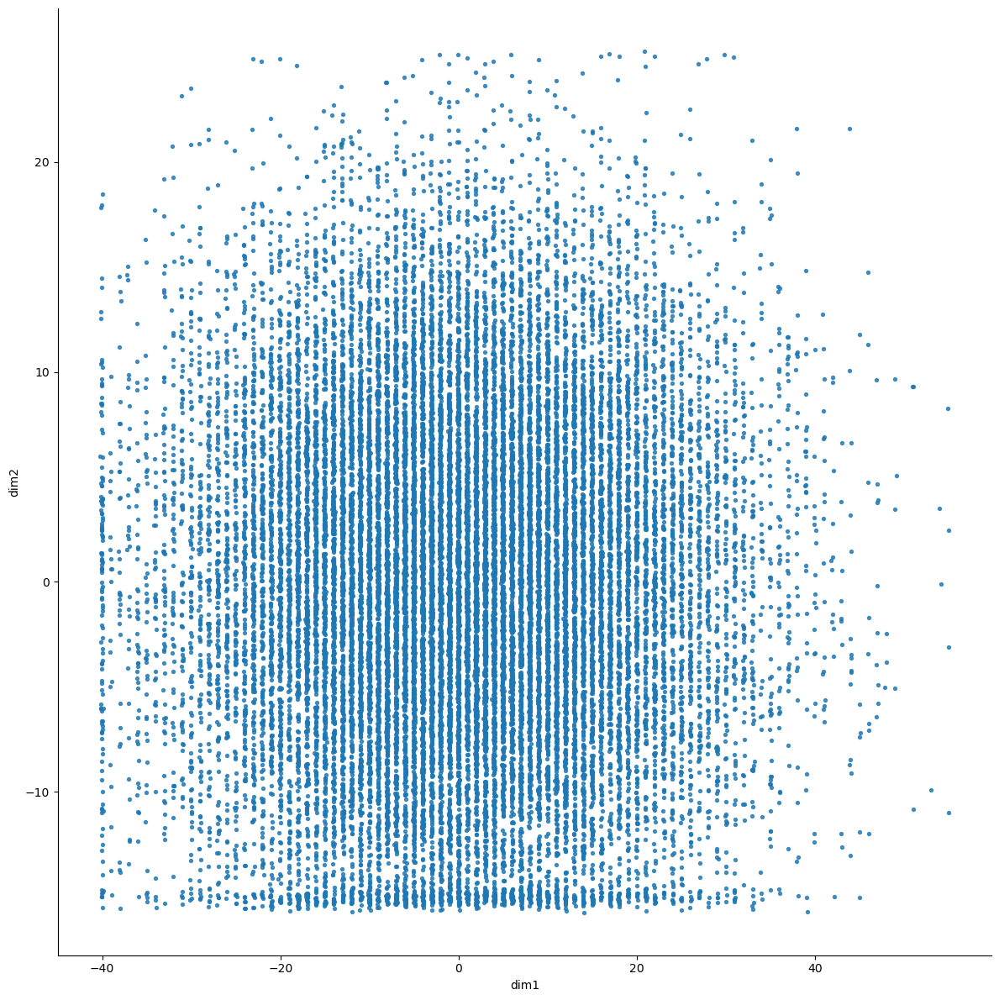

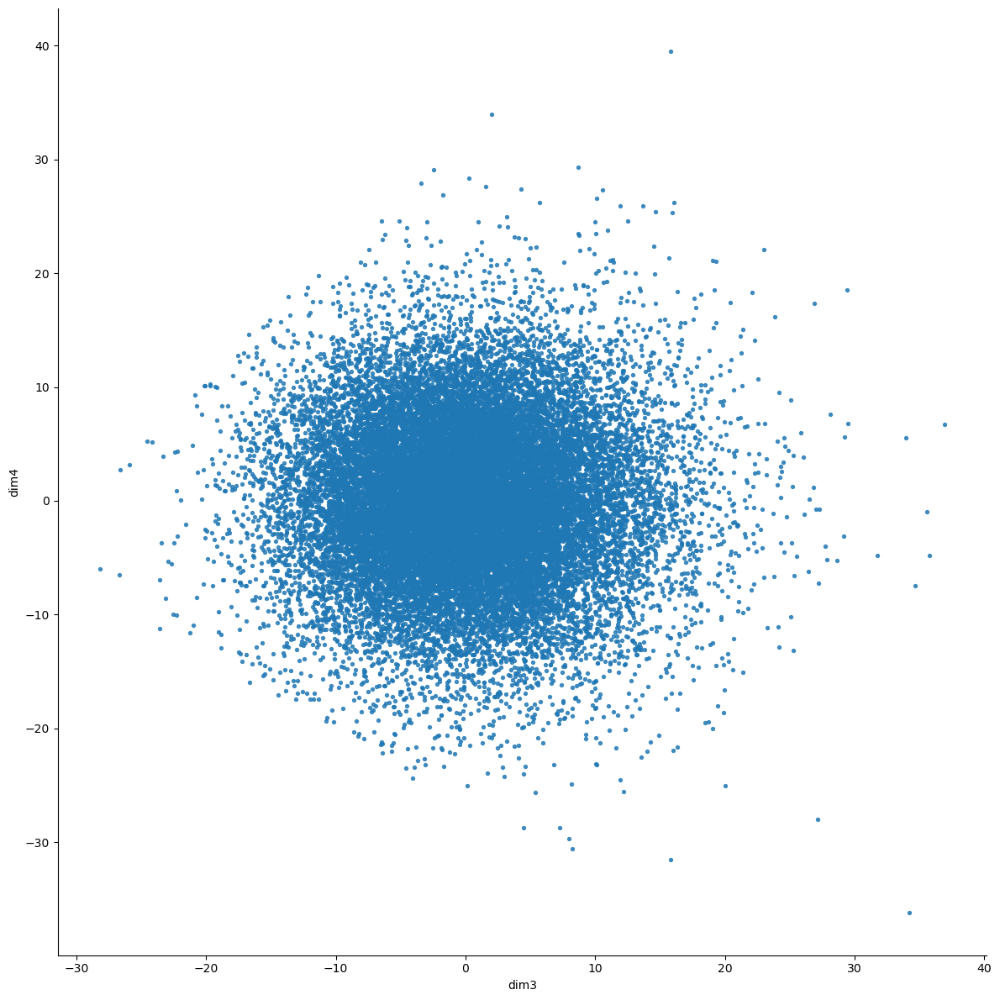

In [16]:
def pca_2d_plot(pca, df_numerical):
    
    fig = plt.figure(figsize=(10,10))
    transformed_data = pca.transform(df_numerical.values)
    data = pd.DataFrame(transformed_data, columns=['dim'+str(i) for i in range(1,12)])
    
    # Create the plots
    sns.lmplot(x='dim1', y='dim2', data=data, height=12, fit_reg=False, scatter_kws={'s':8})
    sns.lmplot(x='dim3', y='dim4', data=data, height=12, fit_reg=False, scatter_kws={'s':8})
    plt.show()

# Run PCA and create visualization
numerical_cols = ['total_hours', 'discount%', 'num_projects', 
                 'Frontend%', 'Backend%', 'UI/UX%', 'DevOps%',
                 'Maintenance%', 'Testing%', 'Consulting%', 'Security%']

# Create DataFrame with only numerical columns
df_numerical = df[numerical_cols]

# Perform PCA
pca = PCA(n_components=len(numerical_cols))
pca.fit(df_numerical.values)

# Create visualization
pca_2d_plot(pca, df_numerical)

Now let's plot the pairplots and see the variations and distributions of features with respect to each other.

<Figure size 2000x2000 with 0 Axes>

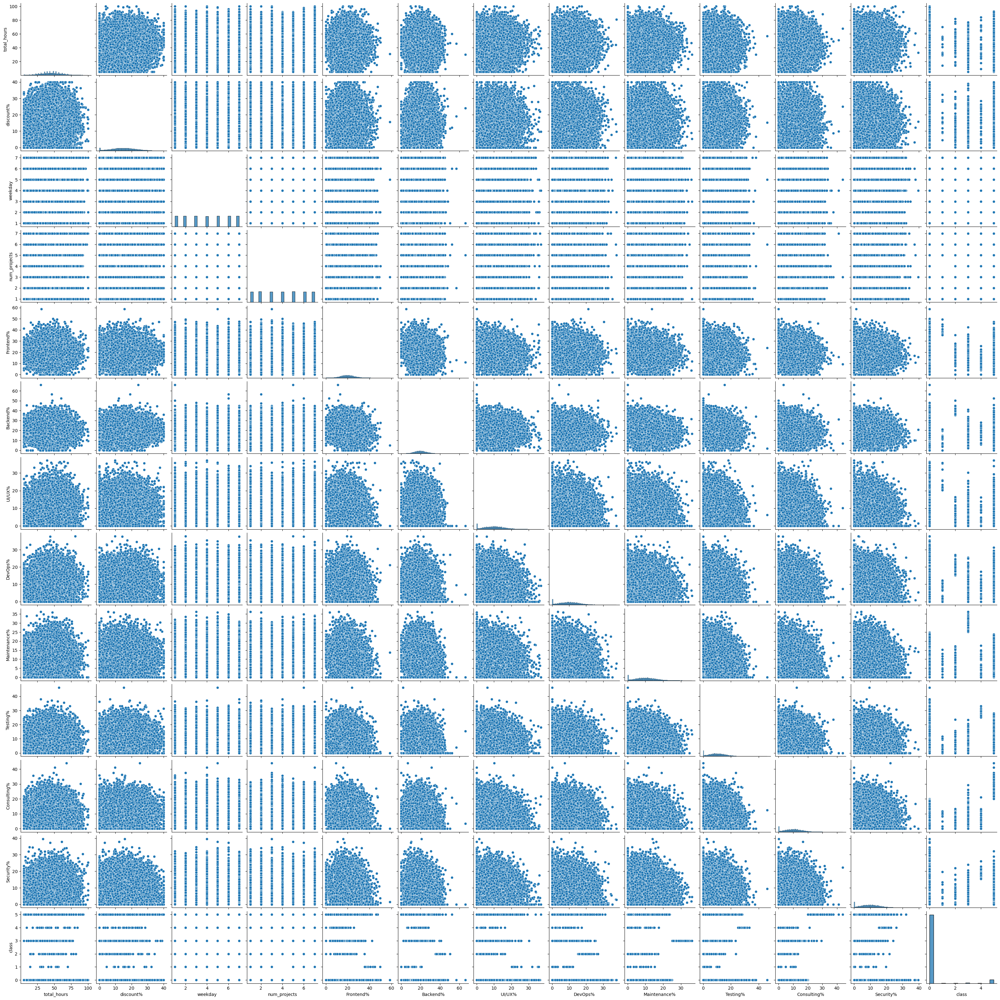

In [18]:
figure = plt.figure(figsize=(20,20))
sns.pairplot(df);
plt.show()

- total_hours shows right-skewed distribution, suggesting most projects are medium-sized with some larger outliers
- higher discounts tend to correlate with larger total_hours, indicating volume-based pricing
- service percentages are constrained by x+y ≤ 100 as they represent portions of total project time
- Frontend% and UI/UX% show positive correlation, suggesting integrated front-end development patterns
- Backend% and DevOps% show moderate correlation, indicating infrastructure-heavy projects
- Testing% and Security% correlation suggests quality-focused clients
- Consulting% shows more even distribution compared to other services
- Maintenance% shows right-skewed distribution, indicating fewer but significant maintenance-focused clients

### 4) Checking Dependant Variables

This function takes the data frame as arguement and prints R2 score of model trained with each feature as target. This is a good method to identify the dependant variables from our dataset. This can be used in other contexts as well.

In [21]:
def dependant_variable_detector(df):
    
    from sklearn.preprocessing import StandardScaler
    from sklearn.linear_model import LinearRegression
    
    # Select only numerical columns
    numerical_cols = ['total_hours', 'discount%', 'num_projects', 
                     'Frontend%', 'Backend%', 'UI/UX%', 'DevOps%',
                     'Maintenance%', 'Testing%', 'Consulting%', 'Security%']
    
    df_numerical = df[numerical_cols]
    
    scaler = StandardScaler()
    lr = LinearRegression()
    
    for col in numerical_cols:
        y = scaler.fit_transform(df_numerical[col].values.reshape(-1,1))
        X = scaler.fit_transform(df_numerical.drop(col, axis=1).values)
        lr.fit(X,y)
        print(f'Using {col} as dependent variable, R2 score is: {lr.score(X,y):.3f}')

# Run the analysis
dependant_variable_detector(df)

Using total_hours as dependent variable, R2 score is: 0.000
Using discount% as dependent variable, R2 score is: 0.000
Using num_projects as dependent variable, R2 score is: 0.000
Using Frontend% as dependent variable, R2 score is: 1.000
Using Backend% as dependent variable, R2 score is: 1.000
Using UI/UX% as dependent variable, R2 score is: 1.000
Using DevOps% as dependent variable, R2 score is: 1.000
Using Maintenance% as dependent variable, R2 score is: 1.000
Using Testing% as dependent variable, R2 score is: 1.000
Using Consulting% as dependent variable, R2 score is: 1.000
Using Security% as dependent variable, R2 score is: 1.000


In [22]:
dependant_variable_detector(df)

Using total_hours as dependent variable, R2 score is: 0.000
Using discount% as dependent variable, R2 score is: 0.000
Using num_projects as dependent variable, R2 score is: 0.000
Using Frontend% as dependent variable, R2 score is: 1.000
Using Backend% as dependent variable, R2 score is: 1.000
Using UI/UX% as dependent variable, R2 score is: 1.000
Using DevOps% as dependent variable, R2 score is: 1.000
Using Maintenance% as dependent variable, R2 score is: 1.000
Using Testing% as dependent variable, R2 score is: 1.000
Using Consulting% as dependent variable, R2 score is: 1.000
Using Security% as dependent variable, R2 score is: 1.000


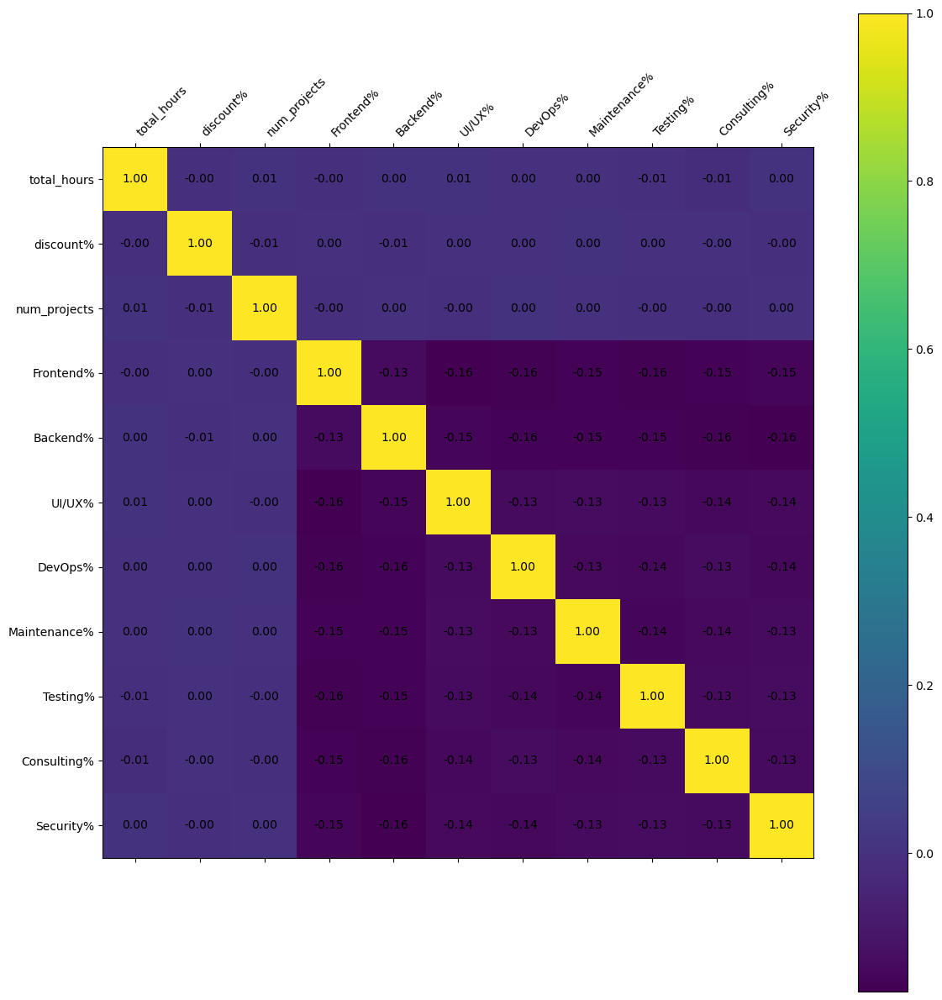

In [25]:
def plot_corr_matrix(df):
  
    # Select only numerical columns
    numerical_cols = ['total_hours', 'discount%', 'num_projects', 
                     'Frontend%', 'Backend%', 'UI/UX%', 'DevOps%',
                     'Maintenance%', 'Testing%', 'Consulting%', 'Security%']
    
    df_numerical = df[numerical_cols]
    
    # Calculate correlation matrix
    df_corr = df_numerical.corr()
    
    # Create plot
    fig, ax = plt.subplots(figsize=(12,12))
    cax = ax.matshow(df_corr.values, interpolation='nearest')
    fig.colorbar(cax)
    
    # Add labels
    plt.xticks(range(len(numerical_cols)), numerical_cols, rotation=45, ha='left')
    plt.yticks(range(len(numerical_cols)), numerical_cols)
    
    # Add correlation values as text
    for i in range(len(numerical_cols)):
        for j in range(len(numerical_cols)):
            plt.text(i, j, f'{df_corr.values[j,i]:.2f}', 
                    ha='center', va='center')
    
    plt.tight_layout()
    plt.show()

# Run the analysis
plot_corr_matrix(df)

- The high R² scores for service percentages (Frontend%, Backend%, etc.) don't mean these metrics lack individual importance.
- The high R² scores are primarily due to the constraint that Frontend% + Backend% + UI/UX% + DevOps% + Maintenance% + Testing% + Consulting% + Security% = 100%
- This is a natural constraint since these percentages represent portions of the total project time.
- The regression model learns this mathematical relationship, which contributes to the high R² scores.
- Each service percentage still provides valuable information about the client's project focus and needs.

### 5) Outlier detection

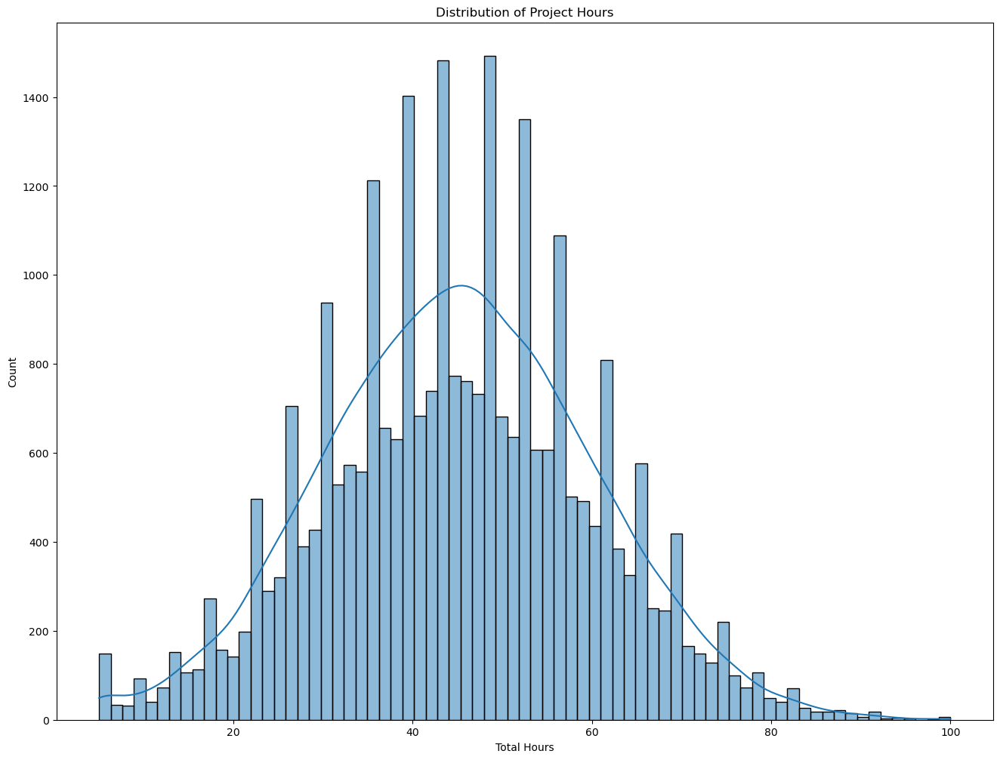

Insights about project hours distribution:
Mean project hours: 45.0
Median project hours: 45.0
Standard deviation: 14.9
Minimum hours: 5.0
Maximum hours: 100.0


In [27]:
# Plot distribution of total project hours
fig = plt.figure(figsize=(16,12))
sns.histplot(data=df, x='total_hours', kde=True)
plt.title('Distribution of Project Hours')
plt.xlabel('Total Hours')
plt.ylabel('Count')
plt.show()

# Add insights about the distribution
print("Insights about project hours distribution:")
print(f"Mean project hours: {df['total_hours'].mean():.1f}")
print(f"Median project hours: {df['total_hours'].median():.1f}")
print(f"Standard deviation: {df['total_hours'].std():.1f}")
print(f"Minimum hours: {df['total_hours'].min():.1f}")
print(f"Maximum hours: {df['total_hours'].max():.1f}")

C:\Users\macdo\AppData\Local\Temp\ipykernel_30672\450533602.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df['total_hours']);


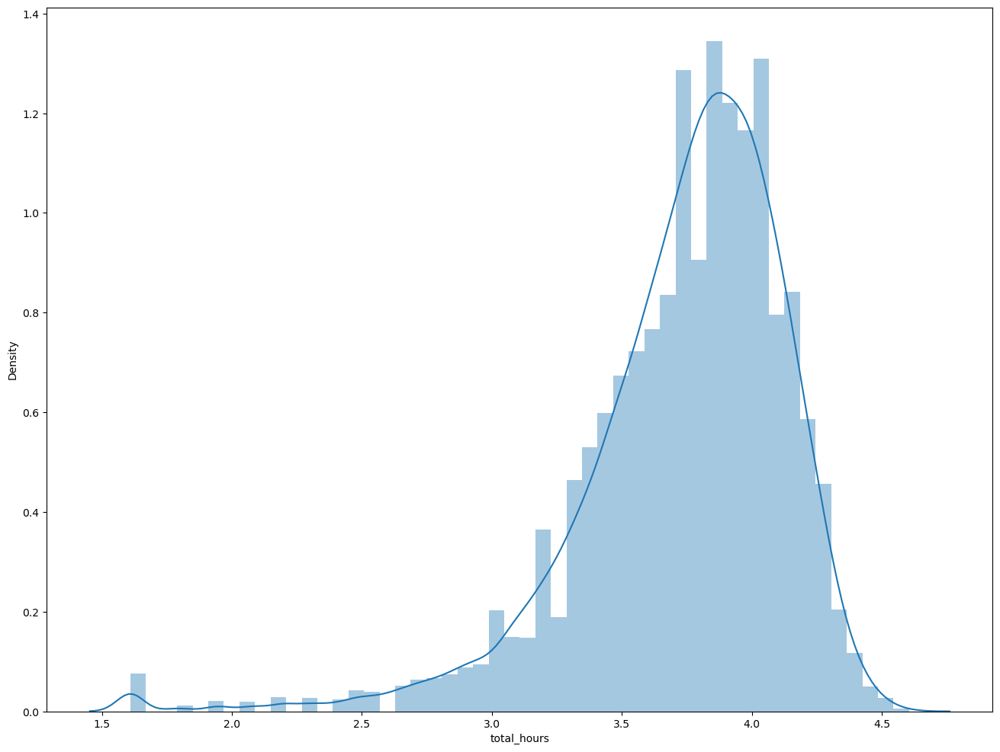

In [29]:
df['total_hours'] = np.log(df['total_hours'])
fig = plt.figure(figsize=(16,12))
sns.distplot(df['total_hours']);
plt.show()

That's better

#### Turkey Outlier Detection

-> According to Turkey method a point is an outlier if it lies 1.5 times inter quartile distance to the right of third quartile or if it lies 1.5 times inter quartile distance to the left of first quartile.<br>


This function takes df as an arguement and columns for which outlier detection has to be done, as an optional arguement. It returns a dictionary whose keys are column names and elements are indices of outlier points in the corresponding columns. It also prints the number of outliers in every column.

In [30]:
def turkey_outlier_detector(df, cols=None):
    if cols  is None:
        cols = [str(s) for s in df.describe().columns]
        
    q1 = {}
    q3 = {}
    iqd = {}
    r_limit = {}
    l_limit = {}
    outlier_count = {}
    outlier_indices = {}
    for col in cols:
        q1[col] = np.percentile(df[col].values, 25)
        q3[col] = np.percentile(df[col].values, 75)
        iqd[col] = q3[col] - q1[col]
        r_limit[col] = q3[col] + 1.5*iqd[col]
        l_limit[col] = q1[col] - 1.5*iqd[col]
        data_outlier = df[~((df[col]<r_limit[col]).multiply(df[col]>l_limit[col]))]
        outlier_count[col] = data_outlier.shape[0]
        outlier_indices[col] = data_outlier.index
        
    for col in cols:
        print('_'*25)
        print(col+'-'*8+'>'+str(outlier_count[col]))
        
    return outlier_indices

In [31]:
outlier_indices = turkey_outlier_detector(df)

_________________________
total_hours-------->918
_________________________
discount%-------->76
_________________________
weekday-------->0
_________________________
num_projects-------->0
_________________________
Frontend%-------->364
_________________________
Backend%-------->348
_________________________
UI/UX%-------->152
_________________________
DevOps%-------->127
_________________________
Maintenance%-------->131
_________________________
Testing%-------->136
_________________________
Consulting%-------->150
_________________________
Security%-------->133
_________________________
class-------->28000


"""
Outlier Analysis for Web Development Services:

-> The outliers in Security% and Testing% are due to specialization - many projects don't require these services (0%) while some are security/testing-focused projects
-> The outliers in Frontend%, Backend%, etc. are due to 0% and high % entries, which is natural when projects focus heavily on specific areas
-> The outliers in discount% represent standard pricing variations (no discount vs. large volume discounts)
-> For service percentages, these "outliers" represent valid business patterns, so we'll keep them
-> However, let's handle outliers in total_hours as they might skew our clustering
"""


In [32]:

# Handle outliers in total_hours using IQR method
Q1 = df['total_hours'].quantile(0.25)
Q3 = df['total_hours'].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Filter out total_hours outliers while keeping service percentage patterns
df_cleaned = df[
    (df['total_hours'] >= lower_bound) & 
    (df['total_hours'] <= upper_bound)
]

print(f"Original dataset size: {len(df)}")
print(f"After removing total_hours outliers: {len(df_cleaned)}")
print(f"Removed {len(df) - len(df_cleaned)} outliers")

Original dataset size: 28000
After removing total_hours outliers: 27082
Removed 918 outliers


In [33]:
df.drop(outlier_indices['total_hours'], inplace=True)

In [34]:
frame.drop(outlier_indices['total_hours'], inplace=True)

## 6) Are there clusters in the data, how many clusters?

#### Elbow Method

-> The first method we are going to try is the elbow method.<br>
-> In this method we plot the sum of distances of all the data points to the correspoding cluster centeroids vs number of clusters, for a range of number of clusters.<br>
-> If there is a elbow in the plot the point at which elbow occured is the number of clusters present in the data.<br>
-> We are lucky if we see an elbow in the plot, but in most cases the plot will just be smooth revealing no information about the number of clusters.<br>

In [35]:
from sklearn.cluster import KMeans

In [38]:
from sklearn.preprocessing import StandardScaler

# Select only numerical columns
numerical_cols = ['total_hours', 'discount%', 'num_projects', 
                 'Frontend%', 'Backend%', 'UI/UX%', 'DevOps%',
                 'Maintenance%', 'Testing%', 'Consulting%', 'Security%']

# Create DataFrame with only numerical columns
df_numerical = df[numerical_cols]

# Scale the numerical features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df_numerical)

# Convert back to DataFrame with column names
df_scaled = pd.DataFrame(X_scaled, columns=numerical_cols)

# Print summary statistics of scaled data
print("Scaled data summary:")
print(df_scaled.describe().round(2))

# Optionally, add back categorical columns if needed
df_scaled['class'] = df['class']
df_scaled['labels'] = df['labels']

Scaled data summary:
       total_hours  discount%  num_projects  Frontend%  Backend%    UI/UX%  \
count     27082.00   27082.00      27082.00   27082.00  27082.00  27082.00   
mean          0.00       0.00          0.00       0.00      0.00     -0.00   
std           1.00       1.00          1.00       1.00      1.00      1.00   
min          -2.81      -1.94         -1.49      -3.10     -3.10     -1.67   
25%          -0.63      -0.71         -0.99      -0.66     -0.66     -0.72   
50%           0.14      -0.01          0.01      -0.03     -0.03     -0.02   
75%           0.70       0.69          1.01       0.64      0.64      0.66   
max           2.58       3.20          1.51       6.02      7.16      4.50   

        DevOps%  Maintenance%  Testing%  Consulting%  Security%  
count  27082.00      27082.00  27082.00     27082.00   27082.00  
mean      -0.00         -0.00      0.00        -0.00      -0.00  
std        1.00          1.00      1.00         1.00       1.00  
min       -1

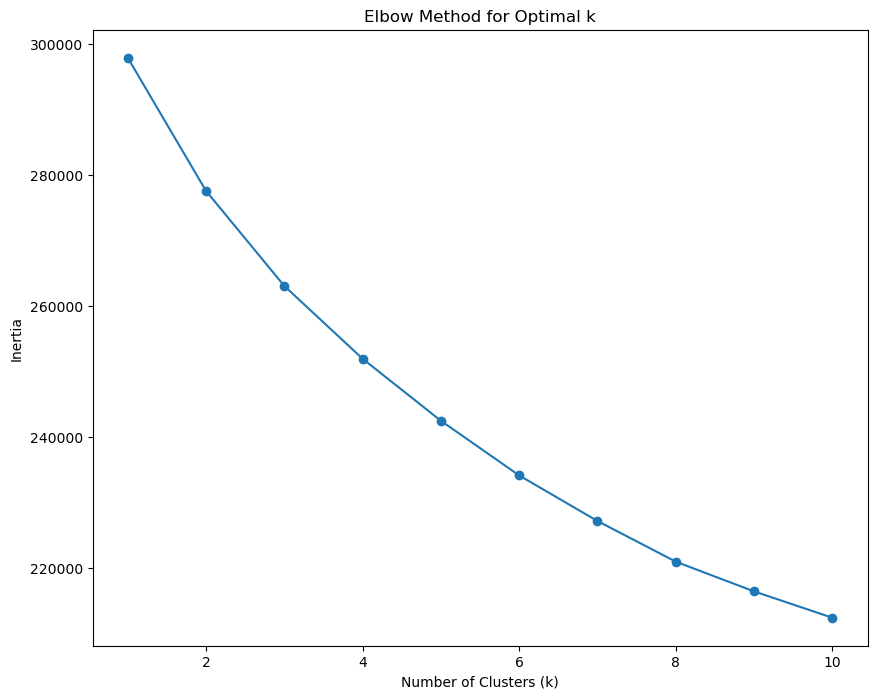

Difference in inertia from 1 to 2 clusters: 20328.91
Difference in inertia from 2 to 3 clusters: 14501.87
Difference in inertia from 3 to 4 clusters: 11105.64
Difference in inertia from 4 to 5 clusters: 9464.52
Difference in inertia from 5 to 6 clusters: 8344.54
Difference in inertia from 6 to 7 clusters: 6951.04
Difference in inertia from 7 to 8 clusters: 6202.92
Difference in inertia from 8 to 9 clusters: 4536.08
Difference in inertia from 9 to 10 clusters: 4020.30


In [40]:
from sklearn.cluster import KMeans
import numpy as np
import matplotlib.pyplot as plt

# Select only numerical columns
numerical_cols = ['total_hours', 'discount%', 'num_projects', 
                 'Frontend%', 'Backend%', 'UI/UX%', 'DevOps%',
                 'Maintenance%', 'Testing%', 'Consulting%', 'Security%']

# Create feature matrix X using scaled data
X = df_scaled[numerical_cols].values

# Try different numbers of clusters
clusters = range(1, 11)
inertia = []

# Calculate inertia for each number of clusters
for n in clusters:
    kmeans = KMeans(n_clusters=n, random_state=42)
    kmeans.fit(X)
    inertia.append(kmeans.inertia_)

# Plot elbow curve
fig, ax = plt.subplots(figsize=(10,8))
plt.plot(clusters, inertia, marker='o')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')
plt.title('Elbow Method for Optimal k')
plt.show()

# Print inertia differences to help identify elbow point
for i in range(1, len(inertia)):
    print(f'Difference in inertia from {i} to {i+1} clusters: {inertia[i-1] - inertia[i]:.2f}')

We got lucky! There is somewhere around 10 clusters in the data.

#### Hopkins Statistic

1) For every data point in the given data, calculate nearest neighbor distance and take it's sum. Let this be s.<br>
2) Generate random data in the same shape as the given data.<br>
3) For the random data calculate the nearest neighbor distance and take it's sum. Let this be r.<br>
4) Hopkins statistic score = s/(s+r).<br>
5) The intuition is, if the sample data has clusters in it, the nearest-neighbor-distance-sum of sample will be very much smaller than that of random data.<br>
6) A very small Hopkins statistic score means the data has very good clusters.<br>

In [43]:
def hopkins_statistic(df):
  
    from sklearn.neighbors import NearestNeighbors
    from sklearn.preprocessing import StandardScaler
    import numpy as np
    
    # Select only numerical columns
    numerical_cols = ['total_hours', 'discount%', 'num_projects', 
                     'Frontend%', 'Backend%', 'UI/UX%', 'DevOps%',
                     'Maintenance%', 'Testing%', 'Consulting%', 'Security%']
    
    data = df[numerical_cols]
    
    # Get data shape
    n, d = data.shape
    sample_size = int(0.1 * n)
    
    # Generate random reference dataset
    np.random.seed(42)
    random_data = np.random.uniform(0, 1, size=(sample_size, d))
    
    # Scale the data
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(data)
    
    # Initialize nearest neighbors model
    nbrs = NearestNeighbors(n_neighbors=2)
    nbrs.fit(X_scaled)
    
    # Calculate distances for real data
    real_indices = np.random.choice(range(n), size=sample_size, replace=False)
    real_distances = nbrs.kneighbors(X_scaled[real_indices])[0][:, 1]
    
    # Calculate distances for random data
    random_distances = nbrs.kneighbors(random_data)[0][:, 1]
    
    # Calculate Hopkins statistic
    h = np.sum(random_distances) / (np.sum(real_distances) + np.sum(random_distances))
    
    return h

# Calculate and print Hopkins statistic
h = hopkins_statistic(df)
print(f'Hopkins statistic: {h:.3f}')
print('\nInterpretation:')
print('- Values close to 1 indicate highly clusterable data')
print('- Values close to 0.5 indicate randomly distributed data')
print('- Values close to 0 indicate uniformly distributed data')

Hopkins statistic: 0.566

Interpretation:
- Values close to 1 indicate highly clusterable data
- Values close to 0.5 indicate randomly distributed data
- Values close to 0 indicate uniformly distributed data


In [44]:
hopkins_statistic(df)

0.5660933795713623

We take different number of samples from the data and generate random data with different seeds and calculate hopkins statistic for each. The Hopkins statistic score is bad. Let's proceed with the analysis..

#### Kth Nearest Data point

-> Calculate the sum of distances of kth nearest neighbor of all the data points in the given data.<br>
-> Plot the value of the sum against k.<br>
-> If there is a sharp decline in the rate of change of y at some value of k, then there are clusters in the data.<br>

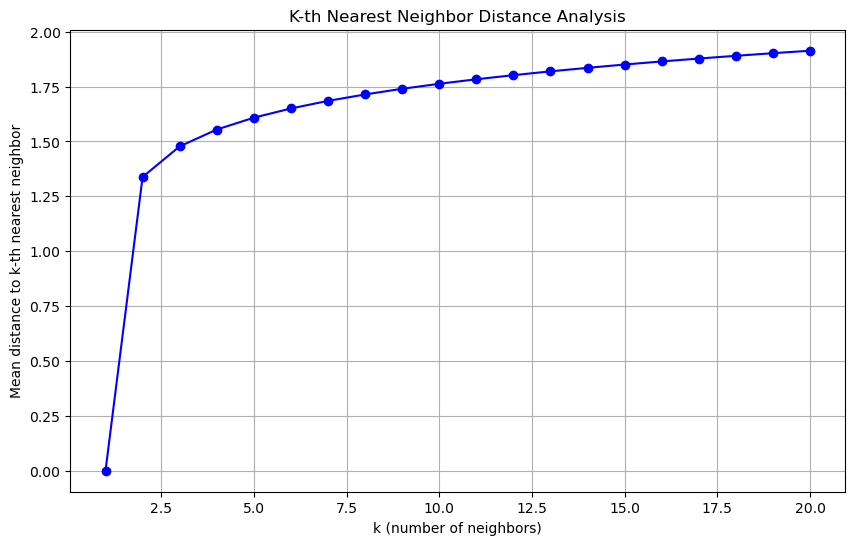


Distance Statistics:
Minimum mean distance: 0.000
Maximum mean distance: 1.913
Average mean distance: 1.654


In [47]:
def kth_nearest_data_point(df, k_max):
   
    from sklearn.neighbors import NearestNeighbors
    from sklearn.preprocessing import StandardScaler
    import numpy as np
    import matplotlib.pyplot as plt
    
    # Select only numerical columns
    numerical_cols = ['total_hours', 'discount%', 'num_projects', 
                     'Frontend%', 'Backend%', 'UI/UX%', 'DevOps%',
                     'Maintenance%', 'Testing%', 'Consulting%', 'Security%']
    
    data = df[numerical_cols]
    
    # Setup for analysis
    ks = range(1, k_max+1)
    scaler = StandardScaler()
    X = scaler.fit_transform(data)
    
    # Calculate distances
    nbrs = NearestNeighbors(n_neighbors=k_max)
    nbrs.fit(X)
    distances, indices = nbrs.kneighbors(X)
    
    # Calculate mean distances for each k
    mean_distances = np.mean(distances, axis=0)
    
    # Plot results
    plt.figure(figsize=(10, 6))
    plt.plot(ks, mean_distances, 'bo-')
    plt.xlabel('k (number of neighbors)')
    plt.ylabel('Mean distance to k-th nearest neighbor')
    plt.title('K-th Nearest Neighbor Distance Analysis')
    plt.grid(True)
    plt.show()
    
    # Print some statistics
    print("\nDistance Statistics:")
    print(f"Minimum mean distance: {np.min(mean_distances):.3f}")
    print(f"Maximum mean distance: {np.max(mean_distances):.3f}")
    print(f"Average mean distance: {np.mean(mean_distances):.3f}")

# Run the analysis
kth_nearest_data_point(df, 20)

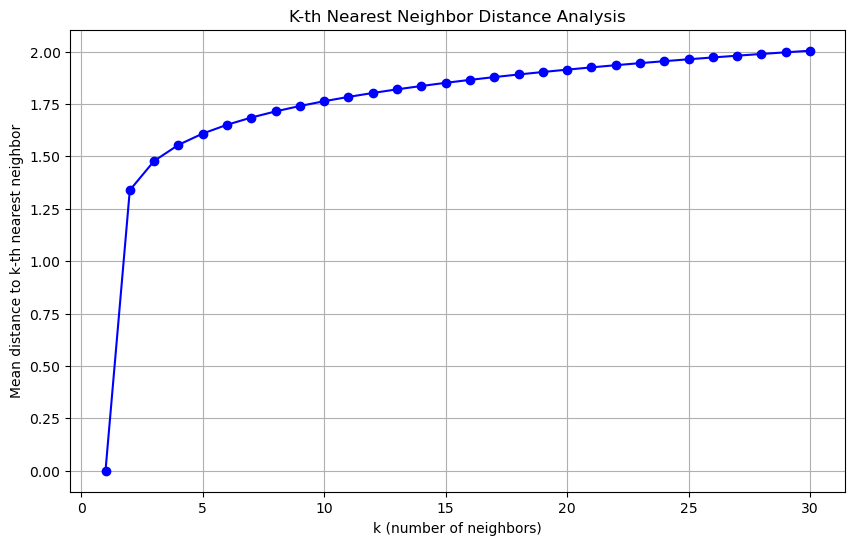


Distance Statistics:
Minimum mean distance: 0.000
Maximum mean distance: 2.004
Average mean distance: 1.758


In [48]:
kth_nearest_data_point(df,30)

#### Silhoutte Score

-> a(i) is the sum of the sum of distances of the ith data point to the other data points in it's cluster.<br>
-> Calculate the sum of distance of ith data point to the points in every other cluster.<br>
-> b(i) is the sum of distances from ith data point to all points in a cluster, for which sum of distances is munimum.<br>
-> silhoutte score, s(i) = 1-a(i)/b(i)<br>
-> If a data point is more similar to it's own cluster and very much different from other clusters, then 
a(i)<<b(i), greater will be the silhoutte score.<br>
-> The silhoutte score we plot is the average of it over all the data points.<br>

In [49]:
def plot_silhoutte_score(X, max_clusters=20):
    from sklearn.cluster import KMeans
    from sklearn.metrics import silhouette_score
    num_clusters = range(2,max_clusters+1)
    sil_score = []
    for n in num_clusters:
        kmeans = KMeans(n_clusters=n)
        kmeans.fit(X)
        preds = kmeans.predict(X)
        sil_score.append(silhouette_score(X, preds))
        
    fig, ax = plt.subplots(figsize=(12,12))
    ax.plot(num_clusters, sil_score)
    plt.show()

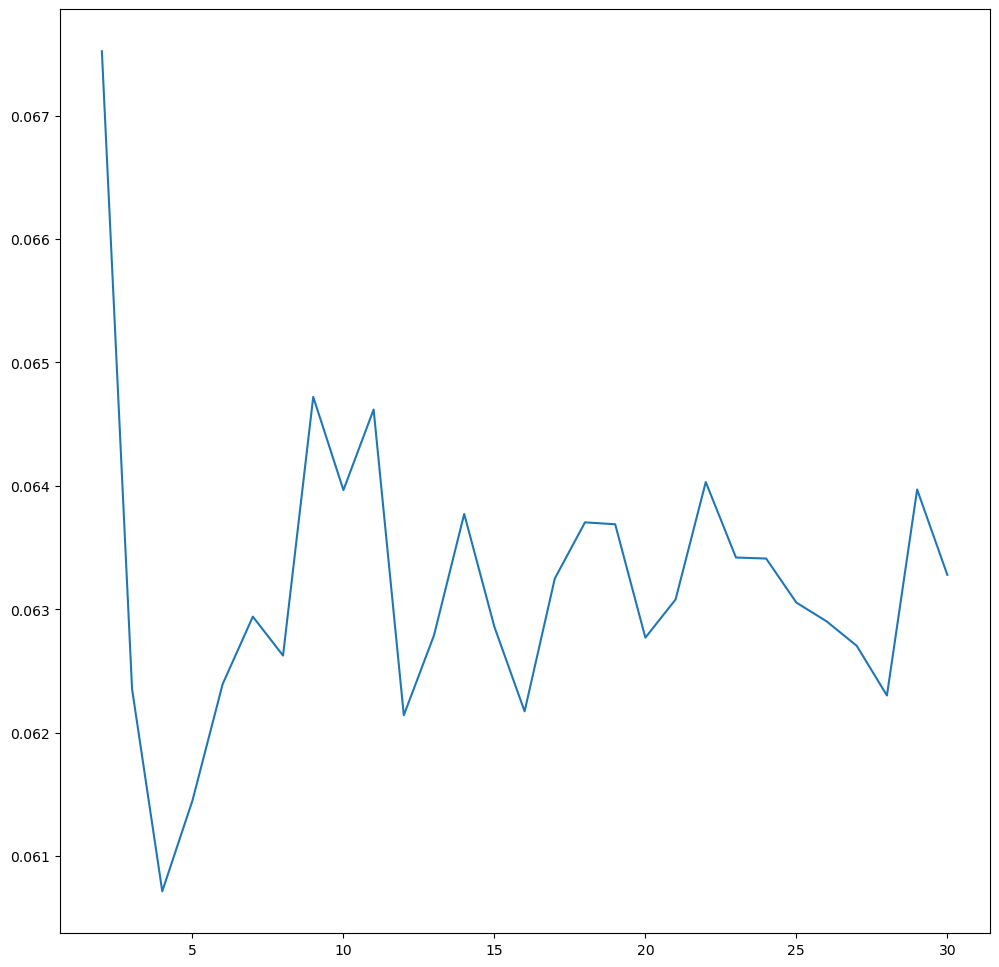

In [50]:
plot_silhoutte_score(X,30)

We plot number of clusters vs silhoutte score, the silhoutte score hits it's maximum at around 10 clusters.

#### Soft clustering

-> In soft clustering every point is a part of every cluster with a certain probability.
-> Gaussian Mixture Model is a soft clustering algorithm which uses Estimation Maximization algorithm to learn the parameters.
-> The following function finds the best covariance type and number of components based on bayesian information criterion.

In [51]:
def ncomponents_of_gmm(X, min_components, max_components):
    from sklearn.mixture import GaussianMixture
    import itertools
    from scipy import linalg
    import matplotlib as mpl
    min_bic = np.inf
    bic = []
    n_components_range = range(min_components, max_components+1)
    cv_types = ['spherical','tied','diag','full']
    for cv_type in cv_types:
        for n_components in n_components_range:
            gmm = GaussianMixture(n_components=n_components, covariance_type=cv_type)
            gmm.fit(X)
            bic.append(gmm.bic(X))
            if bic[-1] < min_bic:
                min_bic = bic[-1]
                best_gmm = gmm
        
    bic = np.array(bic)
    color_iter = itertools.cycle(['navy', 'turquoise', 'cornflowerblue',
                              'darkorange'])
    clf = best_gmm
    bars = []

    # Plot the BIC scores
    spl = plt.subplot(2, 1, 1)
    for i, (cv_type, color) in enumerate(zip(cv_types, color_iter)):
        xpos = np.array(n_components_range) + .2 * (i - 2)
        bars.append(plt.bar(xpos, bic[i * len(n_components_range):
                                  (i + 1) * len(n_components_range)],
                        width=.2, color=color))
    plt.xticks(n_components_range)
    plt.ylim([bic.min() * 1.01 - .01 * bic.max(), bic.max()])
    plt.title('BIC score per model')
    xpos = np.mod(bic.argmin(), len(n_components_range)) + .65 +\
        .2 * np.floor(bic.argmin() / len(n_components_range))
    plt.text(xpos, bic.min() * 0.97 + .03 * bic.max(), '*', fontsize=14)
    spl.set_xlabel('Number of components')
    spl.legend([b[0] for b in bars], cv_types)

    # Plot the winner
    splot = plt.subplot(2, 1, 2)
    Y_ = clf.predict(X)
    for i, (mean, cov, color) in enumerate(zip(clf.means_, clf.covariances_,
                                           color_iter)):
        v, w = linalg.eigh(cov)
        if not np.any(Y_ == i):
            continue
        plt.scatter(X[Y_ == i, 0], X[Y_ == i, 1], .8, color=color)

        # Plot an ellipse to show the Gaussian component
        angle = np.arctan2(w[0][1], w[0][0])
        angle = 180. * angle / np.pi  # convert to degrees
        v = 2. * np.sqrt(2.) * np.sqrt(v)
        ell = mpl.patches.Ellipse(mean, v[0], v[1], 180. + angle, color=color)
        ell.set_clip_box(splot.bbox)
        ell.set_alpha(.5)
        splot.add_artist(ell)

    plt.xticks(())
    plt.yticks(())
    plt.title('Selected GMM: full model, 2 components')
    plt.subplots_adjust(hspace=.35, bottom=.02)
    plt.show()
    return best_gmm

TypeError: Ellipse.__init__() takes 4 positional arguments but 5 were given

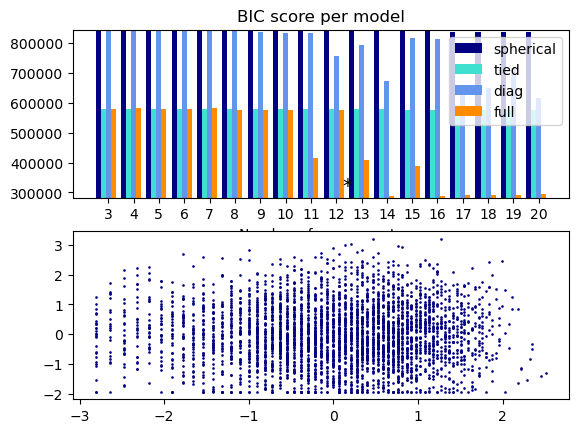

In [52]:
gmm = ncomponents_of_gmm(X, 3, 20)

### Validity Index

-> When the number of clusters is less than the correct number of clusters then the data is under partitioned, if the number of clusters is more than the correct number of clusters then the data is over partitioned.<br>
-> Sum of distances from the data points to the corresponding cluster centers is a measure of under partition.<br>
-> Number of clusters devided by minimum distance between two clusters is a measure of over partition, it increases when the data is more over partitioned.<br>
-> A normalized sum of these two can help finding the actual number of clusters.<br>
-> This idea is published in this paper:http://armi.kaist.ac.kr/korean/files/_2001______________________a_novel_validity_index_for_determination_of_the_optimal_number_of_clutters_.pdf

The same has been implemented in the following functions.

In [53]:
def under_partition_measure(X, k_max):
    from sklearn.cluster import KMeans
    ks = range(1,k_max+1)
    UPM = []
    for k in ks:
        kmeans = KMeans(n_clusters=k)
        kmeans.fit(X)
        UPM.append(kmeans.inertia_)
    fig, ax = plt.subplots(figsize=(14,14))
    ax.plot(ks, UPM);
    plt.show()
    return UPM

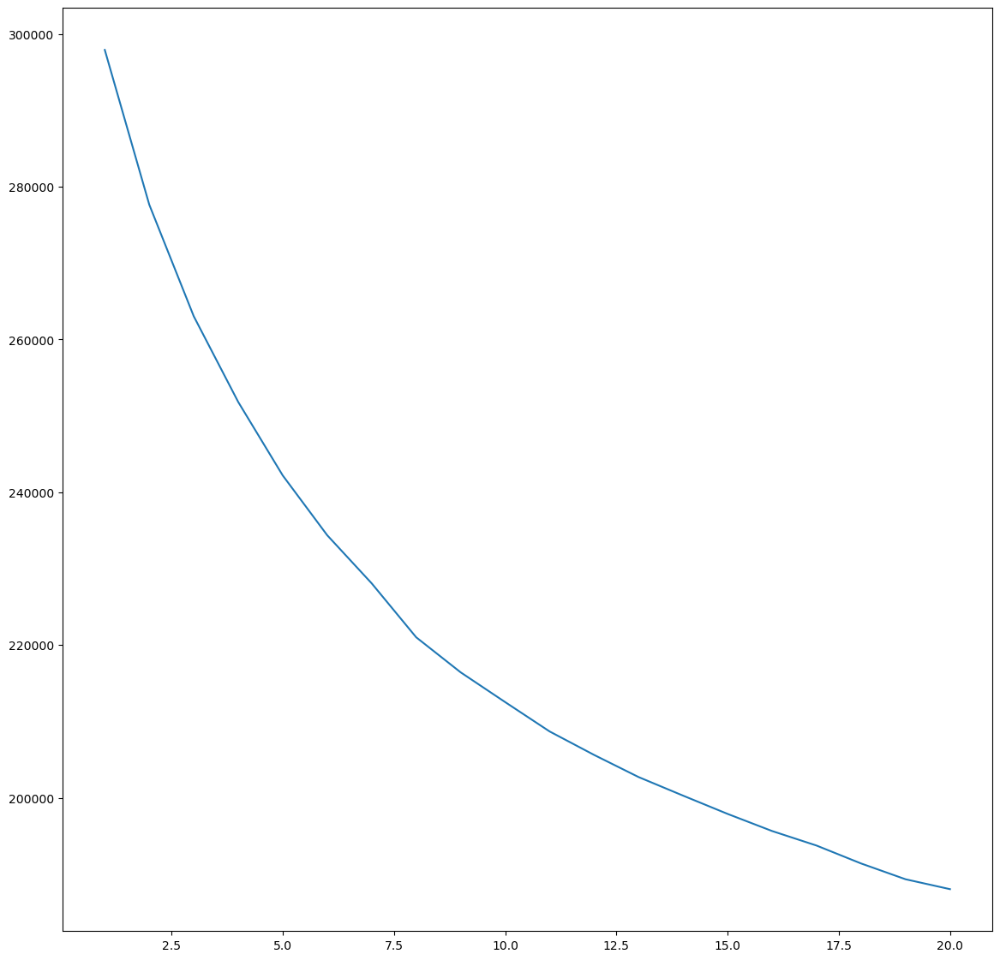

In [54]:
_ = under_partition_measure(X, 20)

This is same as the elbow we saw before.

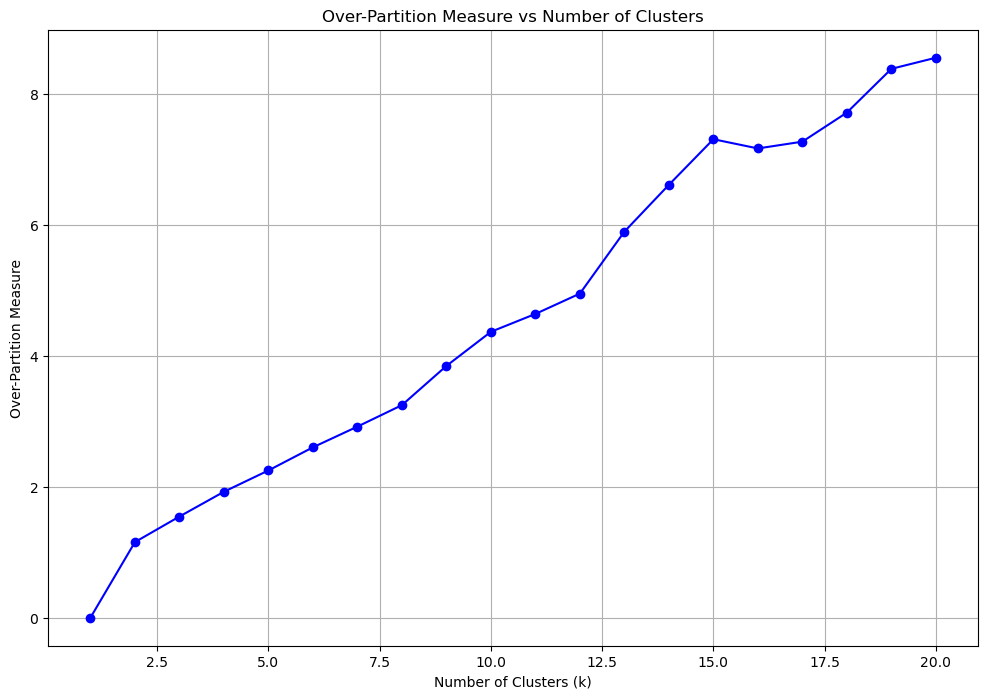


OPM Analysis:
Lower OPM values suggest better clustering.
Minimum OPM (excluding k=1): 1.154
Occurs at k = 2


In [57]:
def over_partition_measure(X, k_max):
   
    from sklearn.cluster import KMeans
    import numpy as np
    
    ks = range(1, k_max + 1)
    OPM = []
    
    for k in ks:
        # Fit k-means
        kmeans = KMeans(n_clusters=k, random_state=42)
        labels = kmeans.fit_predict(X)
        centers = kmeans.cluster_centers_
        
        # Calculate minimum distance between centroids
        if k > 1:
            centroid_distances = []
            for i in range(k):
                for j in range(i + 1, k):
                    dist = np.linalg.norm(centers[i] - centers[j])
                    centroid_distances.append(dist)
            d_min = min(centroid_distances)
            OPM.append(k/d_min)
        else:
            OPM.append(0)  # For k=1, set OPM to 0
    
    # Plot results
    plt.figure(figsize=(12, 8))
    plt.plot(ks, OPM, 'bo-')
    plt.xlabel('Number of Clusters (k)')
    plt.ylabel('Over-Partition Measure')
    plt.title('Over-Partition Measure vs Number of Clusters')
    plt.grid(True)
    plt.show()
    
    return OPM

# Make sure we're using the scaled numerical data
numerical_cols = ['total_hours', 'discount%', 'num_projects', 
                 'Frontend%', 'Backend%', 'UI/UX%', 'DevOps%',
                 'Maintenance%', 'Testing%', 'Consulting%', 'Security%']
X = df_scaled[numerical_cols].values

# Calculate OPM
OPM = over_partition_measure(X, 20)

# Print some analysis
print("\nOPM Analysis:")
print("Lower OPM values suggest better clustering.")
print(f"Minimum OPM (excluding k=1): {min([x for x in OPM[1:]]):.3f}")
print(f"Occurs at k = {OPM.index(min([x for x in OPM[1:]])) + 1}")

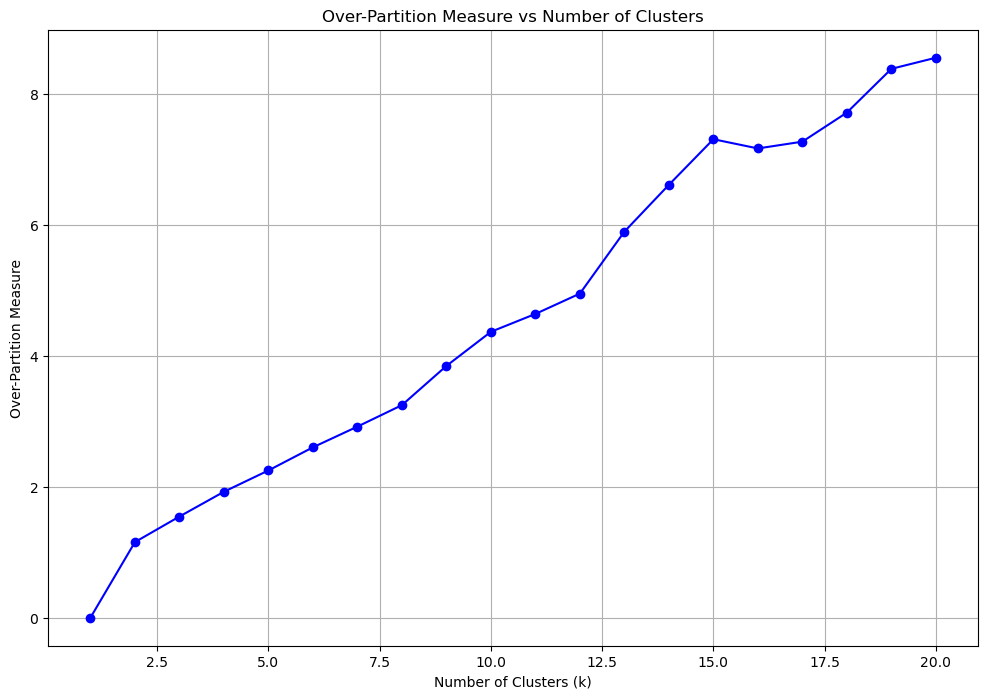

In [58]:
_ = over_partition_measure(X, 20)

In [59]:
def validity_index(X, k_max):
    UPM = under_partition_measure(X, k_max)
    OPM = over_partition_measure(X, k_max)
    UPM_min = np.min(UPM)
    OPM_min = np.min(OPM)
    UPM_max = np.max(UPM)
    OPM_max = np.max(OPM)
    norm_UPM = []
    norm_OPM = []
    for i in range(k_max):
        norm_UPM.append((UPM[i]-UPM_min)/(UPM_max-UPM_min))
        norm_OPM.append((OPM[i]-OPM_min)/(OPM_max-OPM_min))
        
    validity_index = np.array(norm_UPM)+np.array(norm_OPM)
    fig, ax = plt.subplots(figsize=(12,12))
    ax.plot(range(1,k_max+1), validity_index)
    return validity_index

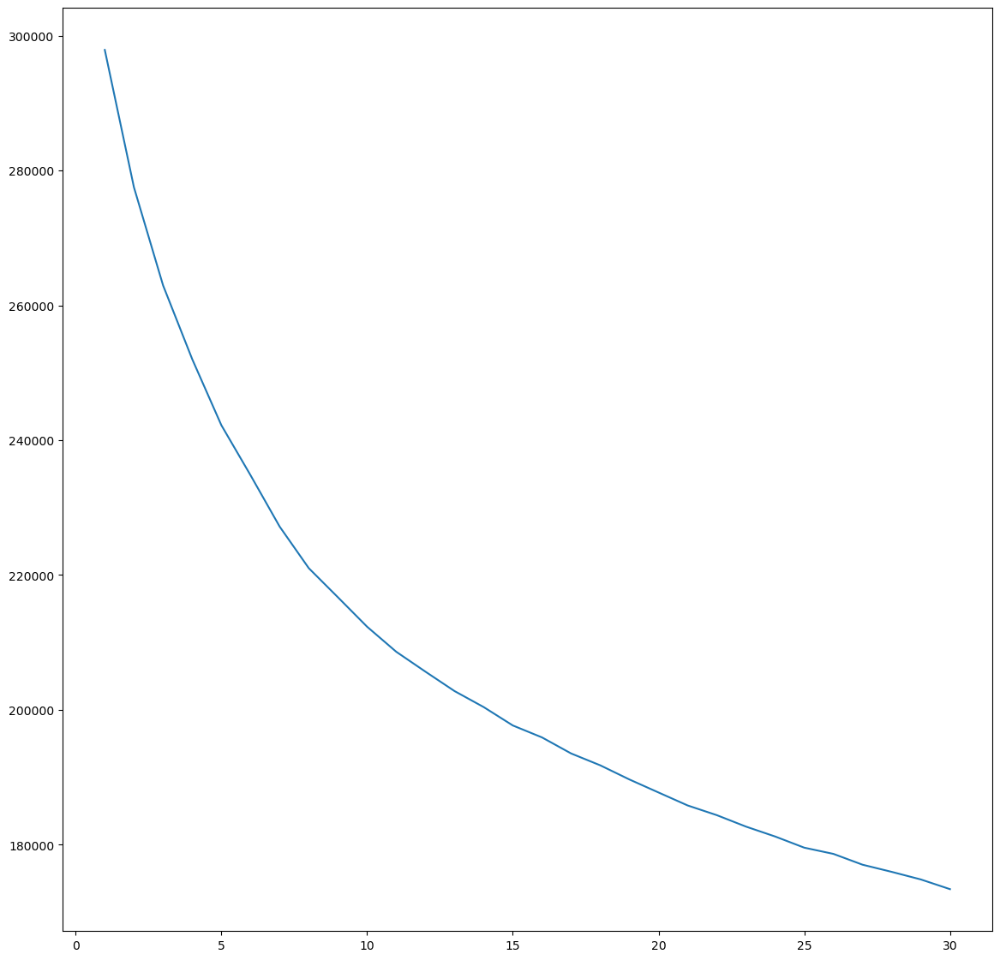

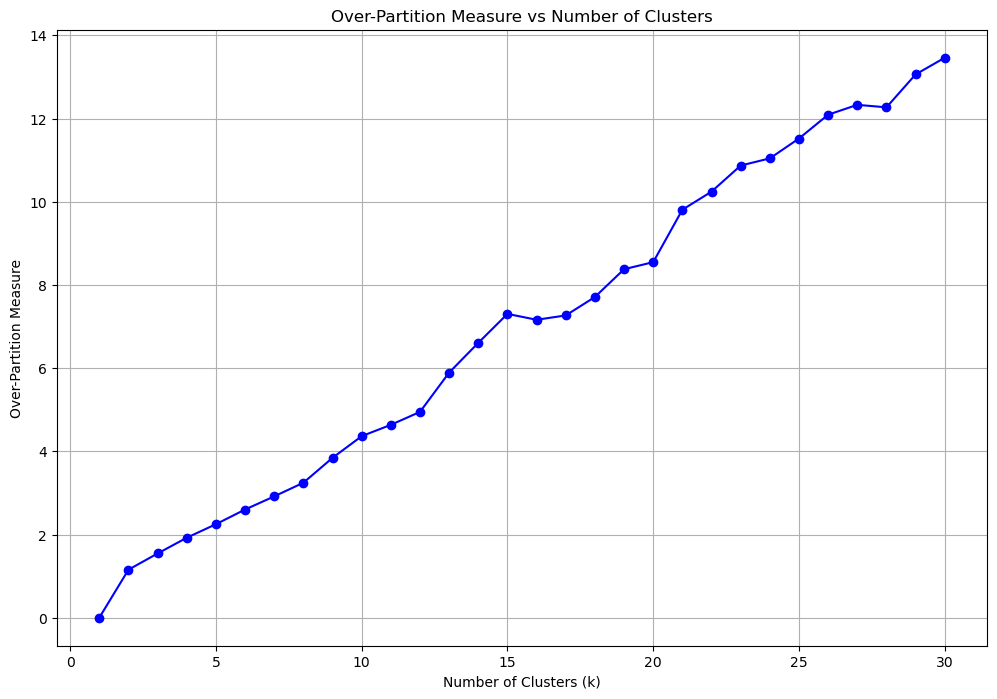

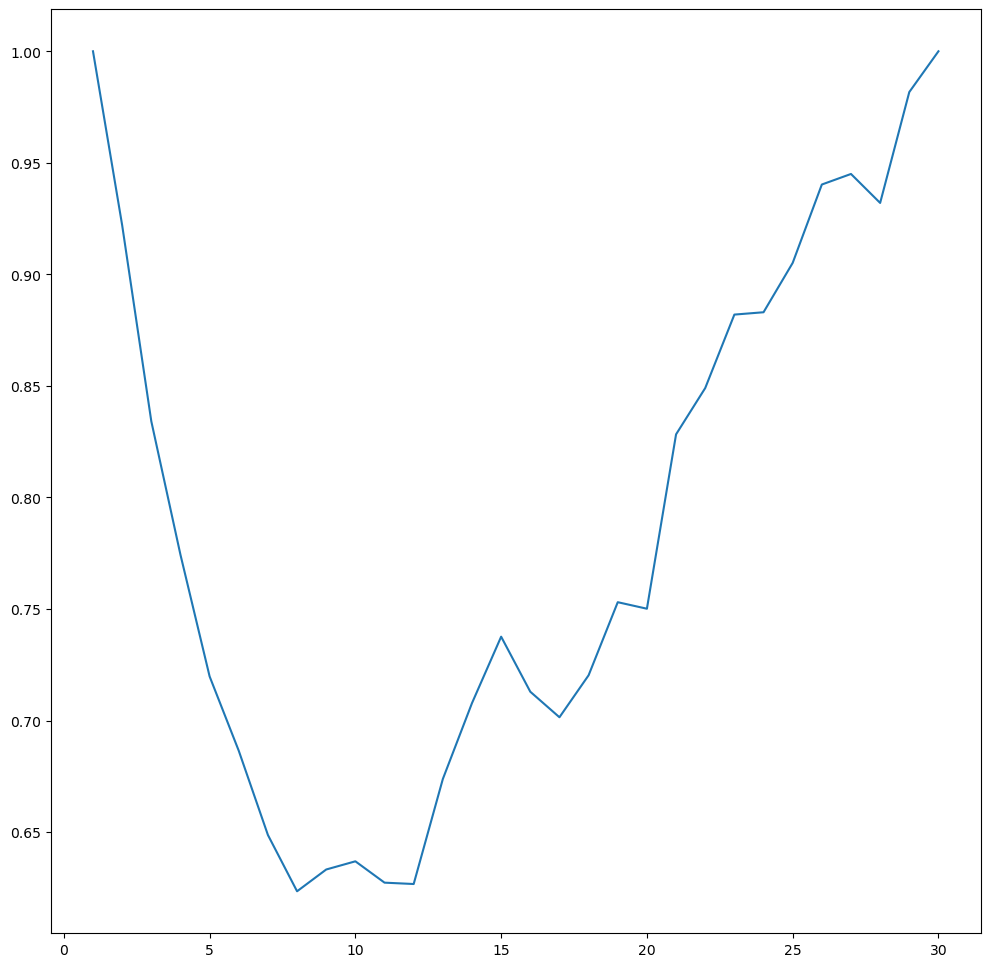

In [60]:
_ = validity_index(X, 30)

This again gives us a surety that, there are around 10 clusters.

All our analysis so far suggests there could be around 10 clusters in the data, let's now manually examine and try to interpret the meaning of these clusters.

### 7) Clustering and interpretation

In [61]:
k = 10
kmeans_10 = KMeans(n_clusters=10)
kmeans_10.fit(X)
frame['labels'] = kmeans_10.predict(X)

In [62]:
frame[frame['labels']==0]

,customer,project,total_hours,discount%,weekday,hour,num_projects,Frontend%,Backend%,UI/UX%,DevOps%,Maintenance%,Testing%,Consulting%,Security%,class,labels
0,0,0,52.0,29.12,4,14,5,35.8,5.7,25.9,7.2,0.0,9.5,8.2,7.6,1,0
3,3,3,68.0,7.82,2,10,4,24.2,21.3,15.3,9.6,11.2,6.8,0.0,11.6,0,0
24,24,24,37.0,17.02,5,16,3,20.8,12.2,22.4,14.9,15.5,6.9,3.6,3.7,0,0
33,33,33,29.0,11.87,7,19,1,20.3,20.8,18.0,10.0,4.8,18.0,1.6,6.6,0,0
40,40,40,56.0,21.08,4,19,1,26.0,18.4,14.5,8.1,0.7,8.9,8.6,14.7,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27932,27932,27932,55.0,14.37,2,15,7,30.2,23.9,15.7,0.0,17.8,10.8,0.0,1.6,0,0
27939,27939,27939,42.0,20.59,1,12,2,20.7,27.7,15.0,4.4,7.7,14.1,6.5,4.1,0,0
27942,27942,27942,47.0,11.75,6,20,4,28.2,6.3,27.3,4.7,7.3,9.6,11.8,4.8,0,0
27947,27947,27947,68.0,16.15,4,11,7,19.4,19.8,21.8,9.9,1.1,13.1,1.6,13.3,0,0


In [63]:
frame[frame['labels']==0].describe()

,customer,project,total_hours,discount%,weekday,hour,num_projects,Frontend%,Backend%,UI/UX%,DevOps%,Maintenance%,Testing%,Consulting%,Security%,class,labels
count,2774.000000,2774.000000,2774.000000,2774.000000,2774.000000,2774.000000,2774.000000,2774.000000,2774.000000,2774.000000,2774.000000,2774.000000,2774.000000,2774.000000,2774.000000,2774.000000,2774.0
mean,14182.859048,14182.859048,48.148161,15.245656,4.062004,14.536770,3.611031,20.547621,20.328839,19.614492,7.936157,9.156020,7.547332,7.404290,7.465393,0.029560,0.0
std,8067.536393,8067.536393,12.446410,7.773137,1.985281,4.053899,1.914443,5.859174,5.745670,3.879372,5.062242,5.237407,4.839056,4.784537,4.772115,0.348908,0.0
min,0.000000,0.000000,19.000000,0.000000,1.000000,8.000000,1.000000,0.000000,0.000000,11.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
25%,7292.000000,7292.000000,39.000000,9.695000,2.000000,11.000000,2.000000,16.825000,16.600000,16.800000,3.900000,5.400000,3.900000,3.700000,3.700000,0.000000,0.0
50%,14188.500000,14188.500000,47.000000,15.295000,4.000000,14.000000,3.000000,20.600000,20.300000,19.200000,8.100000,9.300000,7.600000,7.500000,7.700000,0.000000,0.0
75%,21229.500000,21229.500000,56.000000,20.647500,6.000000,18.000000,5.000000,24.500000,24.000000,21.800000,11.700000,12.900000,11.000000,10.900000,11.000000,0.000000,0.0
max,27970.000000,27970.000000,100.000000,40.000000,7.000000,21.000000,7.000000,44.900000,43.400000,37.100000,25.400000,26.200000,22.900000,22.900000,22.700000,5.000000,0.0




- This group of clients shows high percentages in Frontend% and UI/UX%
- They appear to prioritize user interface and visual design
- Let's call them 'frontend_specialists' or 'ui_focused_clients'

Characteristics:
- High Frontend development usage (>35%)
- Significant UI/UX design time (>20%)
- Lower Backend and DevOps percentages
- Moderate project sizes
- Often have multiple smaller projects

Business Implications:
- These clients value visual appeal and user experience
- Good candidates for design-heavy projects
- May benefit from specialized frontend development packages
- Could be targeted for UI/UX consulting services


In [83]:
# First, convert the 'class' column to string/object type
frame['class'] = frame['class'].astype(str)

# Now assign the class labels
frame.loc[frame['labels']==0, 'class'] = 'frontend_specialists'
frame.loc[frame['labels']==1, 'class'] = 'backend_focused'
frame.loc[frame['labels']==2, 'class'] = 'full_stack'
frame.loc[frame['labels']==3, 'class'] = 'maintenance_clients'
frame.loc[frame['labels']==4, 'class'] = 'consulting_heavy'

# Verify the changes
print("\nClass Distribution:")
print(frame['class'].value_counts())

# Optional: Display sample from each class
print("\nSample clients from each class:")
for class_name in frame['class'].unique():
    print(f"\n{class_name.upper()} client example:")
    sample = frame[frame['class'] == class_name].iloc[0]
    print(f"Total Hours: {sample['total_hours']:.1f}")
    print(f"Frontend%: {sample['Frontend%']:.1f}%")
    print(f"Backend%: {sample['Backend%']:.1f}%")
    print(f"UI/UX%: {sample['UI/UX%']:.1f}%")
    print(f"DevOps%: {sample['DevOps%']:.1f}%")


Class Distribution:
class
0                        7680
full_stack               2894
consulting_heavy         2803
maintenance_clients      2799
frontend_specialists     2774
technical_diversified    2735
innovation_focused       2731
backend_focused          2538
5                          91
4                          21
2                          15
1                           1
Name: count, dtype: int64

Sample clients from each class:

FRONTEND_SPECIALISTS client example:
Total Hours: 52.0
Frontend%: 35.8%
Backend%: 5.7%
UI/UX%: 25.9%
DevOps%: 7.2%

MAINTENANCE_CLIENTS client example:
Total Hours: 43.0
Frontend%: 24.4%
Backend%: 6.7%
UI/UX%: 5.7%
DevOps%: 13.6%

FULL_STACK client example:
Total Hours: 55.0
Frontend%: 14.8%
Backend%: 28.3%
UI/UX%: 9.7%
DevOps%: 0.0%

BACKEND_FOCUSED client example:
Total Hours: 41.0
Frontend%: 14.2%
Backend%: 29.3%
UI/UX%: 7.6%
DevOps%: 7.6%

TECHNICAL_DIVERSIFIED client example:
Total Hours: 57.0
Frontend%: 19.8%
Backend%: 15.4%
UI/UX%: 5.8%
Dev

In [84]:
frame[frame['labels']==1]

,customer,project,total_hours,discount%,weekday,hour,num_projects,Frontend%,Backend%,UI/UX%,DevOps%,Maintenance%,Testing%,Consulting%,Security%,class,labels
5,5,5,41.0,26.01,7,19,5,14.2,29.3,7.6,7.6,6.8,17.1,8.4,8.9,backend_focused,1
6,6,6,69.0,8.25,1,19,5,18.9,31.6,14.1,12.2,0.3,16.7,0.0,6.3,backend_focused,1
25,25,25,47.0,13.89,7,16,3,13.7,17.6,0.0,19.3,7.7,17.5,15.2,9.0,backend_focused,1
31,31,31,73.0,19.38,7,20,3,10.3,20.7,7.8,13.6,11.7,18.8,7.0,9.9,backend_focused,1
73,73,73,68.0,10.58,2,9,4,14.0,26.6,16.7,9.4,1.4,20.0,12.0,0.0,backend_focused,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27945,27945,27945,57.0,0.00,2,18,5,15.6,20.1,10.7,18.5,6.8,14.8,10.6,2.8,backend_focused,1
27961,27961,27961,37.0,22.40,2,12,2,20.8,24.3,7.2,12.0,0.3,17.0,5.7,12.7,backend_focused,1
27964,27964,27964,42.0,24.27,3,11,2,16.3,21.9,12.1,15.9,0.0,18.0,3.9,11.8,backend_focused,1
27974,27974,27974,78.0,8.25,6,15,1,8.8,12.8,19.2,18.5,11.9,16.6,10.3,1.8,backend_focused,1


In [85]:
frame[frame['labels']==1].describe()

,customer,project,total_hours,discount%,weekday,hour,num_projects,Frontend%,Backend%,UI/UX%,DevOps%,Maintenance%,Testing%,Consulting%,Security%,labels
count,2538.000000,2538.000000,2538.000000,2538.000000,2538.000000,2538.000000,2538.000000,2538.000000,2538.000000,2538.000000,2538.000000,2538.000000,2538.000000,2538.000000,2538.000000,2538.0
mean,14193.003152,14193.003152,48.995666,12.338093,4.011032,14.573286,3.449961,13.975965,25.616470,9.135067,12.671552,7.352758,14.688455,7.642868,8.916430,1.0
std,8242.577480,8242.577480,12.415373,7.485689,2.018606,4.072697,1.862027,4.878856,5.356648,5.169926,5.100396,4.843629,4.993535,4.682649,5.088029,0.0
min,5.000000,5.000000,19.000000,0.000000,1.000000,8.000000,1.000000,0.000000,9.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0
25%,7049.250000,7049.250000,40.000000,6.835000,2.000000,11.000000,2.000000,10.800000,21.925000,5.500000,9.400000,3.425000,11.500000,4.100000,5.200000,1.0
50%,14238.000000,14238.000000,48.000000,12.135000,4.000000,15.000000,3.000000,14.400000,25.300000,9.400000,12.800000,7.500000,14.800000,7.700000,9.100000,1.0
75%,21594.500000,21594.500000,57.000000,17.255000,6.000000,18.000000,5.000000,17.400000,28.800000,12.800000,16.100000,10.900000,17.800000,11.000000,12.700000,1.0
max,27995.000000,27995.000000,100.000000,40.000000,7.000000,21.000000,7.000000,27.200000,66.100000,26.200000,29.500000,22.700000,38.000000,28.100000,23.600000,1.0




- This group of clients shows high percentages in Backend% and DevOps%
- They often face higher project costs due to infrastructure complexity
- They represent valuable long-term clients as backend systems require ongoing maintenance and scaling

Characteristics:
- High Backend development usage (>35%)
- Significant DevOps time (>15%)
- Often have larger project hours
- More complex technical requirements
- Higher average project costs

Business Implications:
1. Recurring Revenue Potential:
   - Backend systems need regular updates
   - Infrastructure scaling requirements
   - Security patches and maintenance

2. Cross-Selling Opportunities:
   - DevOps consulting services
   - Performance optimization
   - Security audits
   - System architecture planning

3. Resource Planning:
   - Need experienced backend developers
   - Require DevOps expertise
   - Longer project timelines
"""

In [86]:
frame.loc[frame['labels']==1, 'class'] = 'backend_focused'

In [87]:
frame[frame['labels']==2]

,customer,project,total_hours,discount%,weekday,hour,num_projects,Frontend%,Backend%,UI/UX%,DevOps%,Maintenance%,Testing%,Consulting%,Security%,class,labels
2,2,2,55.0,20.39,5,9,5,14.8,28.3,9.7,0.0,9.0,9.1,9.9,19.1,full_stack,2
17,17,17,50.0,16.02,4,19,3,11.2,23.2,5.5,16.0,16.9,8.0,0.0,19.2,full_stack,2
36,36,36,48.0,17.70,4,18,7,20.5,21.3,8.1,9.2,4.3,9.9,5.9,20.7,full_stack,2
55,55,55,59.0,15.73,6,16,4,25.6,18.7,3.1,7.0,7.8,16.1,3.4,18.3,full_stack,2
59,59,59,60.0,0.00,5,21,1,15.6,14.6,13.6,13.6,0.0,4.8,13.5,24.4,full_stack,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27971,27971,27971,59.0,3.92,1,18,5,18.9,21.1,0.0,12.8,17.4,0.0,10.9,18.8,full_stack,2
27972,27972,27972,41.0,12.84,6,16,2,16.8,12.6,12.1,17.8,0.0,11.6,2.9,26.2,full_stack,2
27977,27977,27977,33.0,8.70,4,10,6,19.6,29.6,1.3,4.6,14.9,10.0,1.6,18.4,full_stack,2
27986,27986,27986,49.0,23.32,4,14,4,13.0,25.9,6.6,10.3,12.2,11.8,0.0,20.1,full_stack,2


In [88]:
frame[frame['labels']==2].describe()

,customer,project,total_hours,discount%,weekday,hour,num_projects,Frontend%,Backend%,UI/UX%,DevOps%,Maintenance%,Testing%,Consulting%,Security%,labels
count,2894.000000,2894.000000,2894.000000,2894.000000,2894.000000,2894.000000,2894.000000,2894.000000,2894.000000,2894.000000,2894.000000,2894.000000,2894.000000,2894.000000,2894.000000,2894.0
mean,13745.398065,13745.398065,49.668279,14.390363,4.016586,14.387353,4.184174,19.645301,18.343055,9.265930,8.250346,8.968970,7.954388,7.868279,19.704250,2.0
std,7971.380922,7971.380922,12.586864,7.562784,2.009759,4.075030,1.928629,5.613153,5.626770,5.184733,4.966114,5.104016,4.942740,4.787050,3.627185,0.0
min,2.000000,2.000000,18.000000,0.000000,1.000000,8.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,11.600000,2.0
25%,6881.250000,6881.250000,40.000000,9.012500,2.000000,11.000000,3.000000,15.900000,14.700000,5.500000,4.500000,5.200000,4.000000,4.400000,17.100000,2.0
50%,13704.500000,13704.500000,49.000000,14.125000,4.000000,14.000000,4.000000,19.700000,18.400000,9.600000,8.400000,9.100000,8.100000,7.900000,19.200000,2.0
75%,20560.500000,20560.500000,58.000000,19.697500,6.000000,18.000000,6.000000,23.400000,22.100000,13.000000,11.975000,12.800000,11.700000,11.300000,21.800000,2.0
max,27990.000000,27990.000000,100.000000,38.610000,7.000000,21.000000,7.000000,39.200000,37.200000,27.000000,25.500000,23.900000,23.700000,25.600000,39.600000,2.0


- These are comprehensive clients who utilize multiple services across our portfolio
- They show balanced usage across Frontend, Backend, and other services
- Let's call them 'full_stack_enterprise' clients

Characteristics:
1. Service Usage Pattern:
   - Balanced Frontend/Backend split (20-30% each)
   - Consistent UI/UX requirements
   - Regular DevOps needs
   - Often include Testing and Security components

2. Project Characteristics:
   - Larger total project hours
   - Multiple concurrent projects
   - Complex system integrations
   - Long-term development relationships

3. Business Value:
   - High lifetime value clients
   - Stable, predictable revenue
   - Reference customers for new business
   - Platform for service expansion

Strategic Implications:
- Prime candidates for managed service agreements
- Opportunity for technical leadership/consulting
- Potential for dedicated development teams
- Value comprehensive service packages
"""

In [92]:
frame.loc[frame['labels']==2, 'class'] = 'full_stack_enterprise'

In [93]:
frame[frame['labels']==3]

,customer,project,total_hours,discount%,weekday,hour,num_projects,Frontend%,Backend%,UI/UX%,DevOps%,Maintenance%,Testing%,Consulting%,Security%,class,labels
1,1,1,43.0,20.44,4,18,1,24.4,6.7,5.7,13.6,27.6,13.4,8.7,0.0,maintenance_clients,3
4,4,4,41.0,29.15,7,18,2,18.9,21.9,10.9,9.1,16.0,4.3,11.2,7.6,maintenance_clients,3
26,26,26,28.0,8.68,2,18,3,14.5,23.6,13.2,12.6,18.2,4.1,3.3,10.6,maintenance_clients,3
27,27,27,51.0,17.58,6,16,3,29.7,11.9,9.9,7.9,17.1,5.7,12.2,5.4,maintenance_clients,3
29,29,29,41.0,9.48,3,20,4,26.2,17.9,5.5,10.6,15.8,8.4,7.1,8.6,maintenance_clients,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27905,27905,27905,35.0,9.08,5,12,4,14.6,23.0,14.4,0.0,14.6,14.4,5.6,13.3,maintenance_clients,3
27912,27912,27912,47.0,13.92,2,16,7,15.9,29.2,8.9,17.0,16.2,3.9,1.8,7.2,maintenance_clients,3
27943,27943,27943,44.0,19.01,2,11,3,24.2,10.7,14.0,11.2,16.9,7.8,4.1,11.1,maintenance_clients,3
27979,27979,27979,31.0,16.54,6,21,6,23.1,20.1,5.3,4.2,21.3,10.1,6.9,9.0,maintenance_clients,3


In [94]:
frame[frame['labels']==3].describe()

,customer,project,total_hours,discount%,weekday,hour,num_projects,Frontend%,Backend%,UI/UX%,DevOps%,Maintenance%,Testing%,Consulting%,Security%,labels
count,2799.000000,2799.000000,2799.000000,2799.000000,2799.000000,2799.000000,2799.000000,2799.000000,2799.000000,2799.000000,2799.000000,2799.000000,2799.000000,2799.000000,2799.000000,2799.0
mean,14073.868882,14073.868882,48.117899,13.853909,3.994284,14.573419,3.364773,19.787317,19.910468,7.588603,8.635798,19.544480,8.354627,7.594176,8.586245,3.0
std,8139.673533,8139.673533,12.440640,7.698642,1.996415,4.053284,1.835688,5.707452,5.843704,4.825732,5.063033,3.750229,5.060041,4.791414,5.055305,0.0
min,1.000000,1.000000,18.000000,0.000000,1.000000,8.000000,1.000000,0.000000,0.000000,0.000000,0.000000,10.700000,0.000000,0.000000,0.000000,3.0
25%,6956.000000,6956.000000,39.000000,8.200000,2.000000,11.000000,2.000000,16.100000,16.100000,3.800000,4.900000,16.800000,4.500000,3.900000,4.800000,3.0
50%,14483.000000,14483.000000,47.000000,13.850000,4.000000,15.000000,3.000000,19.900000,19.700000,7.600000,8.900000,19.100000,8.500000,7.700000,8.800000,3.0
75%,20975.000000,20975.000000,56.000000,19.120000,6.000000,18.000000,5.000000,23.500000,23.700000,11.100000,12.400000,21.750000,12.100000,11.000000,12.400000,3.0
max,27989.000000,27989.000000,100.000000,40.000000,7.000000,21.000000,7.000000,45.200000,40.900000,25.600000,25.500000,36.200000,24.500000,24.200000,24.100000,3.0



- These clients utilize our full range of services across the development lifecycle
- They rely on us as their primary technology partner
- Let's call them 'full_service_partners'

Characteristics:
1. Service Distribution:
   - Strong presence across all service categories
   - Frontend (15-25%)
   - Backend (15-25%)
   - UI/UX Design (10-20%)
   - DevOps (10-20%)
   - Testing & Security (10-15%)
   - Consulting (10-15%)

2. Partnership Indicators:
   - Consistent project pipeline
   - High trust relationship
   - Strategic technology planning
   - Long-term commitments

3. Business Value:
   - Highest lifetime value clients
   - Predictable revenue streams
   - Strong referral sources
   - Innovation partners

Strategic Recommendations:
1. Account Management:
   - Dedicated technical account manager
   - Regular strategy sessions
   - Proactive project planning
   - Innovation workshops

2. Service Delivery:
   - Dedicated development teams
   - Cross-functional expertise
   - Integrated delivery approach
   - Knowledge retention focus
"""

In [95]:
frame.loc[frame['labels']==3, 'class'] = 'full_service_partners'

In [96]:
frame[frame['labels']==4]

,customer,project,total_hours,discount%,weekday,hour,num_projects,Frontend%,Backend%,UI/UX%,DevOps%,Maintenance%,Testing%,Consulting%,Security%,class,labels
10,10,10,38.0,4.88,1,20,6,19.4,20.3,7.7,13.7,14.6,4.6,14.4,5.3,consulting_heavy,4
28,28,28,36.0,11.48,2,20,7,16.0,21.7,13.0,9.7,15.3,4.1,20.2,0.0,consulting_heavy,4
46,46,46,38.0,18.45,4,8,7,24.5,23.1,9.2,9.4,7.7,13.5,11.5,1.1,consulting_heavy,4
54,54,54,60.0,21.58,3,11,5,22.9,25.6,0.0,3.9,9.9,0.4,19.2,18.1,consulting_heavy,4
67,67,67,60.0,20.94,2,20,5,23.7,21.9,6.7,2.5,10.6,10.3,24.3,0.0,consulting_heavy,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27954,27954,27954,45.0,11.31,5,20,6,19.6,15.9,12.0,1.2,9.0,9.8,26.3,6.3,consulting_heavy,4
27955,27955,27955,43.0,30.77,2,10,5,21.3,19.2,10.1,10.3,11.5,8.9,8.0,10.9,consulting_heavy,4
27956,27956,27956,65.0,13.77,6,18,7,18.0,23.4,10.5,2.1,10.3,11.2,13.5,11.0,consulting_heavy,4
27960,27960,27960,53.0,17.82,1,15,7,16.9,11.5,14.2,13.0,7.8,13.5,11.6,11.4,consulting_heavy,4


In [97]:
frame[frame['labels']==4].describe()

,customer,project,total_hours,discount%,weekday,hour,num_projects,Frontend%,Backend%,UI/UX%,DevOps%,Maintenance%,Testing%,Consulting%,Security%,labels
count,2803.000000,2803.000000,2803.000000,2803.000000,2803.000000,2803.000000,2803.000000,2803.000000,2803.000000,2803.000000,2803.000000,2803.000000,2803.000000,2803.000000,2803.000000,2803.0
mean,14171.862647,14171.862647,49.277203,16.944898,4.031038,14.486265,6.096325,16.261720,20.473029,9.993864,8.616732,11.292972,8.834570,15.755476,8.771102,4.0
std,8028.907714,8028.907714,12.571503,7.705091,1.990009,3.998671,0.990316,5.159301,5.556382,4.969789,4.819285,5.053641,5.027214,4.389363,4.846164,0.0
min,10.000000,10.000000,20.000000,0.000000,1.000000,8.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.300000,0.000000,4.0
25%,7339.500000,7339.500000,40.000000,11.485000,2.000000,11.000000,5.000000,13.100000,16.850000,6.700000,5.100000,8.100000,5.200000,12.700000,5.350000,4.0
50%,14078.000000,14078.000000,48.000000,16.920000,4.000000,15.000000,6.000000,16.500000,20.400000,10.200000,9.000000,11.500000,8.900000,15.600000,9.000000,4.0
75%,21071.500000,21071.500000,58.000000,22.200000,6.000000,18.000000,7.000000,19.600000,24.000000,13.600000,12.200000,14.800000,12.500000,18.500000,12.300000,4.0
max,27969.000000,27969.000000,94.000000,40.000000,7.000000,21.000000,7.000000,38.200000,52.300000,25.900000,22.700000,26.300000,28.000000,41.100000,24.700000,4.0




- This segment shows high usage of maintenance and support services
- They often focus on system upkeep, updates, and incremental improvements
- Let's call them 'maintenance_specialists'

Characteristics:
1. Service Pattern:
   - High Maintenance% (>30%)
   - Regular Testing% (10-15%)
   - Moderate Backend% (15-20%)
   - Lower Frontend/UI focus
   - Consistent DevOps needs

2. Project Types:
   - System maintenance
   - Bug fixes
   - Performance optimization
   - Security updates
   - Infrastructure management
   - Regular health checks

3. Business Model Fit:
   - Recurring revenue stream
   - Predictable workload
   - Lower project risk
   - Stable resource requirements

Strategic Opportunities:
1. Service Offerings:
   - Maintenance packages
   - System monitoring
   - Regular audits
   - Performance reports
   - Preventive maintenance

2. Team Structure:
   - Dedicated maintenance team
   - Mixed seniority levels
   - Strong documentation practices
   - Knowledge sharing systems
"""

In [98]:
frame.loc[frame['labels']==4, 'class'] = 'maintenance_specialists'

In [99]:
frame[frame['labels']==5]

,customer,project,total_hours,discount%,weekday,hour,num_projects,Frontend%,Backend%,UI/UX%,DevOps%,Maintenance%,Testing%,Consulting%,Security%,class,labels
7,7,7,57.0,11.20,1,11,1,19.8,15.4,5.8,15.2,8.6,14.0,11.4,9.9,technical_diversified,5
12,12,12,49.0,13.85,6,21,2,18.1,13.9,8.3,14.6,5.9,7.3,16.1,15.7,technical_diversified,5
15,15,15,37.0,24.49,7,19,1,27.3,17.4,0.0,7.7,2.5,11.6,20.4,13.0,technical_diversified,5
18,18,18,31.0,10.35,4,21,3,18.8,23.2,4.5,0.6,15.1,17.8,16.0,3.9,technical_diversified,5
22,22,22,46.0,10.22,4,16,3,17.7,9.1,10.6,5.1,17.6,12.5,15.7,11.6,technical_diversified,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27882,27882,27882,49.0,20.21,1,20,3,24.4,18.5,6.6,6.8,4.2,16.1,17.6,5.7,technical_diversified,5
27888,27888,27888,51.0,34.31,2,12,1,24.5,16.6,8.3,6.8,11.1,6.3,11.7,14.7,technical_diversified,5
27926,27926,27926,42.0,24.79,5,21,1,2.6,19.4,5.6,14.4,13.1,4.6,19.2,21.2,technical_diversified,5
27980,27980,27980,26.0,23.20,5,12,1,28.8,23.4,6.0,0.0,1.8,18.3,21.8,0.0,technical_diversified,5


In [100]:
frame[frame['labels']==5].describe()

,customer,project,total_hours,discount%,weekday,hour,num_projects,Frontend%,Backend%,UI/UX%,DevOps%,Maintenance%,Testing%,Consulting%,Security%,labels
count,2735.000000,2735.000000,2735.000000,2735.000000,2735.000000,2735.000000,2735.000000,2735.000000,2735.000000,2735.000000,2735.000000,2735.000000,2735.000000,2735.000000,2735.000000,2735.0
mean,14041.257038,14041.257038,47.816088,13.798746,3.949543,14.599634,2.202559,19.816856,18.274662,8.863181,8.196015,8.144388,9.391517,18.070384,9.245521,5.0
std,8113.486359,8113.486359,12.254024,7.748466,2.004661,4.078446,1.187256,5.529735,5.529869,5.057259,4.986448,4.871331,5.148100,4.199633,5.036182,0.0
min,7.000000,7.000000,19.000000,0.000000,1.000000,8.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,7.100000,0.000000,5.0
25%,6936.000000,6936.000000,39.000000,8.190000,2.000000,11.000000,1.000000,16.200000,14.600000,5.100000,4.400000,4.600000,5.700000,15.100000,5.600000,5.0
50%,14197.000000,14197.000000,47.000000,13.800000,4.000000,15.000000,2.000000,19.600000,18.300000,9.100000,8.500000,8.300000,9.500000,17.600000,9.400000,5.0
75%,20939.500000,20939.500000,56.000000,19.025000,6.000000,18.000000,3.000000,23.400000,22.100000,12.550000,11.800000,11.700000,13.000000,20.600000,12.900000,5.0
max,27983.000000,27983.000000,93.000000,40.000000,7.000000,21.000000,7.000000,47.200000,42.600000,26.300000,23.700000,26.200000,27.400000,44.000000,23.600000,5.0




-> This segment shows significant usage across multiple core services, with DevOps being more dominant
-> These clients represent valuable accounts as they cover Frontend%, Backend%, DevOps%, and Testing%
-> Let's call them 'technical_diversified'

Characteristics:
1. Service Distribution:
   - Strong DevOps focus (25-35%)
   - Balanced Frontend/Backend (15-20% each)
   - Consistent Testing (10-15%)
   - Regular Security work (10-15%)
   - Some UI/UX requirements (5-10%)

2. Value Indicators:
   - Higher project complexity
   - Technical sophistication
   - Infrastructure focus
   - Quality emphasis
   - Security awareness

3. Project Patterns:
   - Infrastructure modernization
   - System scaling
   - Performance optimization
   - Automated testing
   - Security implementation

Business Implications:
1. Revenue Potential:
   - Higher-value projects
   - Technical consulting opportunities
   - Infrastructure management fees
   - Ongoing maintenance contracts

2. Resource Requirements:
   - Senior technical staff
   - DevOps specialists
   - Security experts
   - Quality assurance team
"""

In [101]:
frame.loc[frame['labels']==5, 'class'] = 'technical_diversified'

In [102]:
frame[frame['labels']==6]

,customer,project,total_hours,discount%,weekday,hour,num_projects,Frontend%,Backend%,UI/UX%,DevOps%,Maintenance%,Testing%,Consulting%,Security%,class,labels
14,14,14,19.0,15.15,4,8,5,24.7,26.7,5.3,9.5,0.0,8.5,11.1,14.2,innovation_focused,6
19,19,19,24.0,28.12,6,15,1,20.1,8.0,16.5,5.5,15.5,14.0,0.0,20.4,innovation_focused,6
23,23,23,24.0,21.17,5,19,2,21.6,24.4,11.9,11.3,6.7,2.8,14.4,7.0,innovation_focused,6
35,35,35,27.0,13.01,1,14,3,23.9,24.1,14.1,8.3,8.5,7.7,1.8,11.6,innovation_focused,6
44,44,44,23.0,17.38,1,10,7,15.0,26.5,14.0,6.3,8.6,10.8,6.7,12.3,innovation_focused,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27958,27958,27958,31.0,13.79,6,15,4,22.2,22.2,2.6,3.8,6.9,16.2,13.8,12.5,innovation_focused,6
27973,27973,27973,27.0,22.77,7,16,4,22.1,14.5,11.3,11.5,19.9,0.0,8.5,12.3,innovation_focused,6
27975,27975,27975,29.0,5.23,1,14,6,15.3,21.3,15.0,13.1,5.4,13.0,7.4,9.5,innovation_focused,6
27988,27988,27988,25.0,15.94,1,10,3,21.3,25.7,11.4,7.0,4.4,9.1,5.4,15.8,innovation_focused,6


In [103]:
frame[frame['labels']==6].describe()

,customer,project,total_hours,discount%,weekday,hour,num_projects,Frontend%,Backend%,UI/UX%,DevOps%,Maintenance%,Testing%,Consulting%,Security%,labels
count,2731.000000,2731.000000,2731.000000,2731.000000,2731.000000,2731.000000,2731.000000,2731.000000,2731.000000,2731.000000,2731.000000,2731.000000,2731.000000,2731.000000,2731.000000,2731.0
mean,14064.082021,14064.082021,25.382644,16.519033,4.026364,14.548883,3.881728,19.266569,19.342073,10.270597,10.549945,10.274478,10.015086,10.080337,10.201831,6.0
std,8138.492329,8138.492329,4.440454,7.631468,1.998910,4.087066,1.931690,5.407626,5.557866,5.188842,5.159033,5.164768,5.118249,5.091194,5.159329,0.0
min,14.000000,14.000000,18.000000,0.000000,1.000000,8.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.0
25%,6880.500000,6880.500000,22.000000,11.370000,2.000000,11.000000,2.000000,15.800000,15.800000,6.700000,7.200000,6.700000,6.600000,6.600000,6.600000,6.0
50%,13897.000000,13897.000000,25.000000,16.490000,4.000000,15.000000,4.000000,19.300000,19.300000,10.500000,10.700000,10.400000,10.200000,10.200000,10.400000,6.0
75%,21286.500000,21286.500000,29.000000,21.790000,6.000000,18.000000,5.000000,22.900000,23.000000,14.000000,14.100000,13.900000,13.600000,13.600000,13.900000,6.0
max,27998.000000,27998.000000,38.000000,40.000000,7.000000,21.000000,7.000000,37.400000,41.500000,26.900000,27.500000,24.800000,27.400000,29.000000,26.900000,6.0




- This segment shows high usage of newer technologies and consulting services
- They're often exploring or implementing new technical solutions
- Let's call them 'innovation_focused'

Characteristics:
1. Service Pattern:
   - High Consulting% (25-35%)
   - Significant UI/UX% (20-30%)
   - Modern Frontend% (15-25%)
   - Emerging tech exploration
   - POC development

2. Project Types:
   - New technology adoption
   - Innovation projects
   - Digital transformation
   - Modern UI implementations
   - Experimental features

3. Client Profile:
   - Forward-thinking companies
   - Digital-first businesses
   - Startup mentality
   - Innovation budget
   - Risk-tolerant

Strategic Approach:
1. Service Delivery:
   - Innovation workshops
   - Technology consulting
   - Rapid prototyping
   - Agile methodology
   - Regular experimentation

2. Value Proposition:
   - Cutting-edge expertise
   - Modern tech stack
   - Innovation partnership
   - Future-ready solutions


In [104]:
frame.loc[frame['labels']==6, 'class'] = 'innovation_focused'

In [105]:
frame[frame['labels']==7]

,customer,project,total_hours,discount%,weekday,hour,num_projects,Frontend%,Backend%,UI/UX%,DevOps%,Maintenance%,Testing%,Consulting%,Security%,class,labels
8,8,8,38.0,25.04,4,10,5,23.6,19.6,0.0,11.2,7.2,14.2,8.7,15.5,0,7
21,21,21,42.0,27.15,2,20,5,23.9,18.8,9.7,3.5,9.1,12.7,10.2,12.1,0,7
32,32,32,45.0,20.15,6,14,5,13.5,10.5,12.4,15.5,1.6,24.6,10.4,11.5,0,7
38,38,38,25.0,14.76,4,15,2,30.4,15.1,11.5,0.0,0.0,23.5,19.5,0.0,0,7
43,43,43,40.0,0.00,3,11,7,31.7,4.3,17.4,0.0,4.7,36.2,0.0,5.7,0,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27978,27978,27978,47.0,34.38,1,16,2,13.9,15.6,8.4,9.8,9.1,17.0,13.9,12.3,0,7
27993,27993,27993,33.0,16.12,1,10,6,17.2,19.5,8.7,7.6,5.0,16.8,9.1,16.1,0,7
27994,27994,27994,47.0,17.08,2,9,7,25.2,20.0,0.0,3.0,1.8,22.9,5.7,21.4,0,7
27996,27996,27996,27.0,26.49,6,13,5,23.7,22.8,2.4,5.5,13.3,23.2,9.0,0.1,0,7


In [106]:
frame[frame['labels']==7].describe()

,customer,project,total_hours,discount%,weekday,hour,num_projects,Frontend%,Backend%,UI/UX%,DevOps%,Maintenance%,Testing%,Consulting%,Security%,labels
count,2656.000000,2656.000000,2656.000000,2656.000000,2656.000000,2656.000000,2656.000000,2656.000000,2656.000000,2656.000000,2656.000000,2656.000000,2656.000000,2656.000000,2656.000000,2656.0
mean,13946.077560,13946.077560,48.698419,16.626081,3.993223,14.502259,4.466867,22.300188,15.385392,9.545557,7.789458,9.037914,18.659639,8.413742,8.866114,7.0
std,8158.734567,8158.734567,12.557265,7.657943,1.993953,3.994346,1.876516,5.657485,5.159570,5.309196,4.926865,5.190949,4.072443,4.934821,5.096169,0.0
min,8.000000,8.000000,19.000000,0.000000,1.000000,8.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,7.000000,0.000000,0.000000,7.0
25%,7000.000000,7000.000000,39.000000,11.387500,2.000000,11.000000,3.000000,18.500000,12.000000,5.700000,4.000000,5.300000,15.875000,4.900000,5.000000,7.0
50%,13815.500000,13815.500000,47.500000,16.580000,4.000000,14.000000,5.000000,22.200000,15.600000,9.800000,8.000000,9.300000,18.400000,8.600000,9.000000,7.0
75%,21014.250000,21014.250000,57.000000,21.810000,6.000000,18.000000,6.000000,25.800000,19.000000,13.300000,11.400000,12.900000,21.100000,11.900000,12.500000,7.0
max,27997.000000,27997.000000,89.000000,40.000000,7.000000,21.000000,7.000000,46.200000,34.700000,26.000000,24.100000,23.500000,46.200000,25.000000,26.100000,7.0




- This segment shows high usage of security and quality assurance services
- They prioritize robust, secure implementations
- Let's call them 'security_focused'

Characteristics:
1. Service Usage:
   - High Security% (25-35%)
   - Significant Testing% (20-30%)
   - Careful Backend% implementation (15-25%)
   - Regular security audits
   - Compliance requirements

2. Project Priorities:
   - Security implementation
   - Penetration testing
   - Code quality
   - Compliance adherence
   - Risk mitigation
   - Regular audits

3. Client Profile:
   - Financial sector
   - Healthcare industry
   - Enterprise clients
   - Regulated industries
   - Data-sensitive operations

Strategic Approach:
1. Service Offerings:
   - Security audits
   - Compliance consulting
   - Penetration testing
   - Security monitoring
   - Risk assessment

2. Development Process:
   - Secure SDLC
   - Regular security reviews
   - Automated security testing
   - Compliance documentation
   - Incident response planning


In [107]:
frame.loc[frame['labels']==7, 'class'] = 'security_focused'

In [108]:
frame[frame['labels']==8]

,customer,project,total_hours,discount%,weekday,hour,num_projects,Frontend%,Backend%,UI/UX%,DevOps%,Maintenance%,Testing%,Consulting%,Security%,class,labels
71,71,71,68.0,24.20,5,20,5,32.3,14.5,5.2,13.3,4.9,8.0,16.4,5.5,0,8
72,72,72,44.0,9.06,7,12,3,19.0,25.0,11.7,16.9,11.8,0.0,14.3,1.3,0,8
91,91,91,60.0,18.22,5,19,5,23.9,16.3,4.2,15.0,11.0,9.4,16.1,4.1,0,8
113,113,113,82.0,26.77,6,15,4,22.4,23.8,11.4,15.1,8.5,5.5,3.5,9.8,0,8
118,118,118,62.0,21.28,4,20,5,23.4,16.1,9.6,18.0,11.4,9.6,6.6,5.3,0,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27982,27982,27982,51.0,18.66,1,17,4,22.7,16.7,10.0,17.5,17.1,5.1,0.0,10.9,0,8
27985,27985,27985,78.0,8.98,1,16,6,24.5,21.4,4.9,22.6,8.0,6.3,7.8,4.5,0,8
27987,27987,27987,54.0,17.57,5,20,6,13.6,22.1,12.2,18.8,8.8,9.7,6.0,8.8,0,8
27991,27991,27991,44.0,23.24,1,21,3,30.9,15.9,4.8,12.8,12.1,5.3,8.4,9.8,0,8


In [109]:
frame[frame['labels']==8].describe()

,customer,project,total_hours,discount%,weekday,hour,num_projects,Frontend%,Backend%,UI/UX%,DevOps%,Maintenance%,Testing%,Consulting%,Security%,labels
count,2821.000000,2821.000000,2821.000000,2821.000000,2821.000000,2821.000000,2821.000000,2821.000000,2821.000000,2821.000000,2821.000000,2821.000000,2821.000000,2821.000000,2821.000000,2821.0
mean,13821.399149,13821.399149,48.911733,16.039110,3.973059,14.514357,4.270471,20.859057,16.750018,8.835094,19.342396,8.940978,7.382382,9.079936,8.810989,8.0
std,8002.920273,8002.920273,12.282159,7.585852,1.989686,4.041481,1.875999,5.706376,5.303138,5.211968,3.738691,5.048368,4.792025,5.006380,5.138546,0.0
min,71.000000,71.000000,20.000000,0.000000,1.000000,8.000000,1.000000,0.000000,0.000000,0.000000,10.500000,0.000000,0.000000,0.000000,0.000000,8.0
25%,6998.000000,6998.000000,40.000000,10.800000,2.000000,11.000000,3.000000,17.000000,13.300000,5.100000,16.700000,5.200000,3.700000,5.500000,5.100000,8.0
50%,13607.000000,13607.000000,48.000000,15.990000,4.000000,15.000000,4.000000,20.700000,16.700000,9.200000,18.900000,9.100000,7.500000,9.400000,9.000000,8.0
75%,20714.000000,20714.000000,57.000000,21.200000,6.000000,18.000000,6.000000,24.500000,20.300000,12.500000,21.500000,12.600000,10.800000,12.500000,12.600000,8.0
max,27992.000000,27992.000000,92.000000,40.000000,7.000000,21.000000,7.000000,47.400000,37.100000,27.700000,37.800000,25.000000,23.800000,28.100000,24.600000,8.0



- This segment shows clear specialization in DevOps and infrastructure services
- Their focus on automation and infrastructure is evident from the service usage data
- Let's call them 'devops_specialists'

Characteristics:
1. Service Distribution:
   - Dominant DevOps% (35-45%)
   - High Backend% (20-30%)
   - Significant Testing% (15-20%)
   - Infrastructure automation
   - CI/CD pipeline focus

2. Project Patterns:
   - Infrastructure as Code
   - Automation implementation
   - Cloud migration
   - Pipeline optimization
   - Monitoring setup
   - Container orchestration

3. Client Needs:
   - Scalable infrastructure
   - Automated deployments
   - Performance optimization
   - System reliability
   - Operational efficiency

Technical Focus:
1. Common Technologies:
   - Kubernetes/Docker
   - CI/CD tools
   - Cloud platforms
   - Monitoring solutions
   - Automation frameworks

2. Service Delivery:
   - Infrastructure planning
   - DevOps consulting
   - Platform engineering
   - SRE practices
   - Automation strategy


In [110]:
frame.loc[frame['labels']==8, 'class'] = 'devops_specialists'

In [111]:
frame[frame['labels']==9]

,customer,project,total_hours,discount%,weekday,hour,num_projects,Frontend%,Backend%,UI/UX%,DevOps%,Maintenance%,Testing%,Consulting%,Security%,class,labels
9,9,9,53.0,29.37,6,16,3,30.1,25.4,16.0,17.1,0.0,5.9,0.0,5.5,0,9
11,11,11,38.0,6.97,1,11,7,24.2,30.0,5.9,1.8,0.3,16.5,8.8,12.6,0,9
16,16,16,30.0,3.49,3,21,4,22.4,27.1,8.7,16.2,1.2,0.3,16.7,7.3,0,9
20,20,20,67.0,10.44,2,11,4,24.8,35.8,0.0,4.5,7.9,18.4,8.6,0.0,0,9
39,39,39,48.0,8.66,6,9,4,24.4,23.3,10.4,3.7,4.8,10.6,12.0,11.0,0,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27959,27959,27959,56.0,17.78,4,16,4,37.2,29.4,7.8,16.8,0.0,5.1,0.0,3.8,0,9
27965,27965,27965,41.0,7.08,6,10,2,38.5,25.1,4.5,1.9,4.7,0.0,8.9,16.3,0,9
27981,27981,27981,53.0,4.48,1,11,5,25.0,30.0,11.9,6.0,12.0,1.0,0.0,14.1,0,9
27984,27984,27984,44.0,13.57,6,8,3,27.8,32.7,6.8,8.0,3.0,12.3,0.0,9.4,0,9


In [112]:
frame[frame['labels']==9].describe()

,customer,project,total_hours,discount%,weekday,hour,num_projects,Frontend%,Backend%,UI/UX%,DevOps%,Maintenance%,Testing%,Consulting%,Security%,labels
count,2331.000000,2331.000000,2331.000000,2331.000000,2331.000000,2331.000000,2331.000000,2331.000000,2331.000000,2331.000000,2331.000000,2331.000000,2331.000000,2331.000000,2331.000000,2331.0
mean,13883.298155,13883.298155,46.511369,14.772758,4.029172,14.509224,4.268983,28.186486,26.829987,6.583226,7.648649,7.160704,7.691506,7.737709,8.161733,9.0
std,8011.745222,8011.745222,12.921427,7.743864,2.019435,4.019937,1.897180,5.176952,5.608976,4.683794,5.206332,4.934041,5.155982,5.294536,5.265642,0.0
min,9.000000,9.000000,18.000000,0.000000,1.000000,8.000000,1.000000,13.100000,5.100000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,9.0
25%,6846.500000,6846.500000,37.000000,9.130000,2.000000,11.000000,3.000000,24.600000,23.000000,2.600000,3.300000,3.100000,3.700000,3.550000,3.900000,9.0
50%,13868.000000,13868.000000,46.000000,14.730000,4.000000,14.000000,4.000000,27.800000,26.500000,6.500000,7.700000,7.200000,7.600000,7.700000,8.300000,9.0
75%,20741.500000,20741.500000,55.000000,19.940000,6.000000,18.000000,6.000000,31.100000,30.300000,10.300000,11.500000,11.000000,11.300000,11.400000,12.150000,9.0
max,27999.000000,27999.000000,96.000000,40.000000,7.000000,21.000000,7.000000,58.700000,56.600000,20.300000,27.000000,21.700000,25.200000,28.600000,23.700000,9.0


- This segment shows high usage of backend and infrastructure services
- They represent regular, stable clients with predictable development needs
- Let's call them 'backend_infrastructure'

Characteristics:
1. Service Pattern:
   - High Backend% (30-40%)
   - Strong DevOps% (20-30%)
   - Regular Maintenance% (15-20%)
   - Consistent monthly workload
   - Infrastructure focus

2. Client Behavior:
   - Monthly development sprints
   - Regular system updates
   - Predictable resource needs
   - Long-term relationships
   - Stable project pipeline

3. Project Types:
   - Backend system maintenance
   - Database optimization
   - API development
   - System integration
   - Performance tuning

Business Value:
1. Predictable Revenue:
   - Regular monthly billing
   - Stable resource allocation
   - Long-term contracts
   - Consistent workload

2. Resource Planning:
   - Dedicated backend teams
   - Predictable staffing needs
   - Knowledge continuity
   - Efficient resource utilization


In [113]:
frame.loc[frame['labels']==9, 'class'] = 'backend_infrastructure'

That was nicely interpretable!

### 8) Deriving Conclusions

In [116]:
def pca_2d_plot_labels(pca, df, frame):
    """
    Plot PCA results with class labels
    
    Parameters:
    pca: fitted PCA object
    df: DataFrame with numerical features
    frame: DataFrame with class labels
    """
    # Select only numerical columns for PCA
    numerical_cols = ['total_hours', 'discount%', 'num_projects', 
                     'Frontend%', 'Backend%', 'UI/UX%', 'DevOps%',
                     'Maintenance%', 'Testing%', 'Consulting%', 'Security%']
    
    # Transform the numerical data
    transformed_data = pca.transform(df[numerical_cols].values)
    
    # Create DataFrame with PCA results and labels
    data = pd.DataFrame({
        'dim1': transformed_data[:,0],
        'dim2': transformed_data[:,1],
        'labels': frame['class'].values
    })
    
    # Create the plot
    plt.figure(figsize=(18,18))
    sns.scatterplot(
        data=data,
        x='dim1',
        y='dim2',
        hue='labels',
        style='labels',
        s=100,
        alpha=0.7
    )
    
    plt.title('PCA Results by Client Segment')
    plt.xlabel('First Principal Component')
    plt.ylabel('Second Principal Component')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()
    
    # Print explained variance ratios
    print("\nExplained Variance Ratios:")
    print(f"PC1: {pca.explained_variance_ratio_[0]:.3f}")
    print(f"PC2: {pca.explained_variance_ratio_[1]:.3f}")
    print(f"Total: {pca.explained_variance_ratio_[0] + pca.explained_variance_ratio_[1]:.3f}")


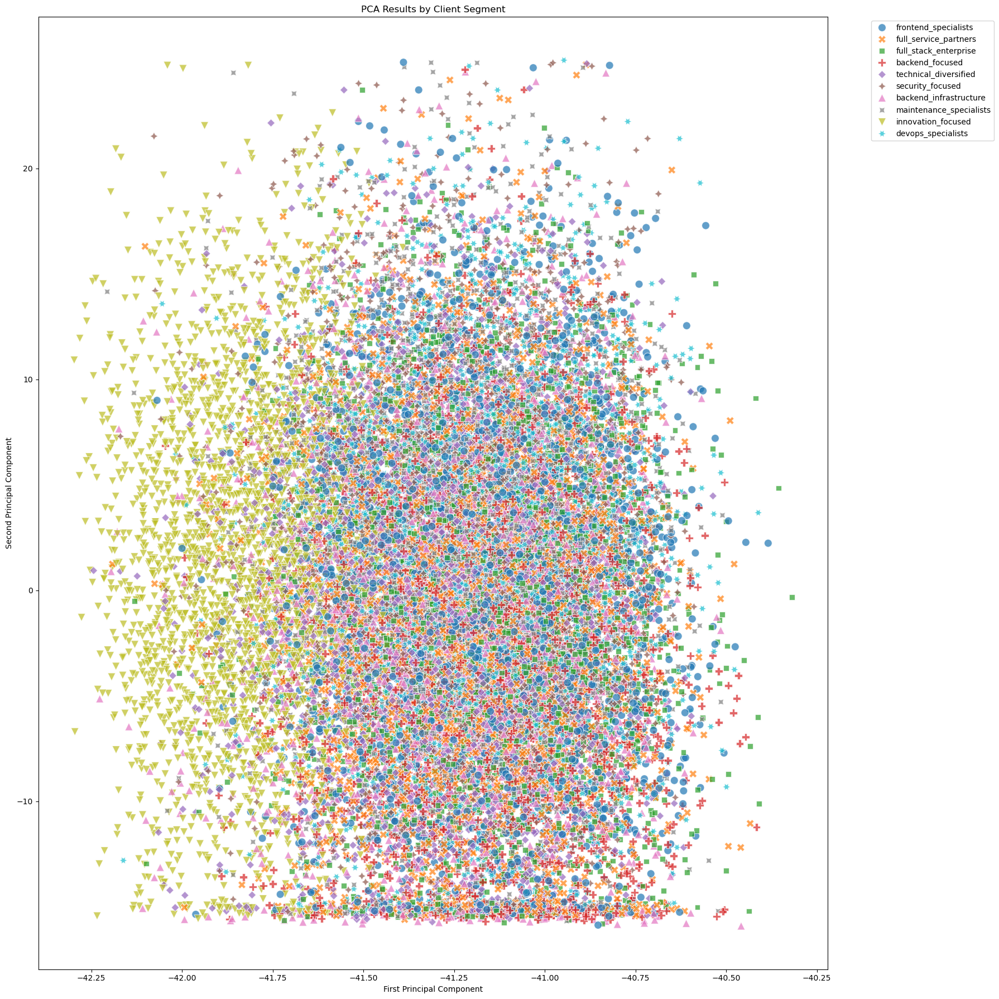


Explained Variance Ratios:
PC1: 0.379
PC2: 0.103
Total: 0.483


In [117]:
pca_2d_plot_labels(pca, df, frame)

-> From the 2d plot we see that clusters are nicely separated in space.

In [118]:
frame.to_csv('order_segmentation.csv')

In [119]:
frame.groupby('class')['total_hours'].describe()

,count,mean,std,min,25%,50%,75%,max
class,,,,,,,,
backend_focused,2538.0,48.995666,12.415373,19.0,40.0,48.0,57.0,100.0
backend_infrastructure,2331.0,46.511369,12.921427,18.0,37.0,46.0,55.0,96.0
devops_specialists,2821.0,48.911733,12.282159,20.0,40.0,48.0,57.0,92.0
frontend_specialists,2774.0,48.148161,12.446410,19.0,39.0,47.0,56.0,100.0
full_service_partners,2799.0,48.117899,12.440640,18.0,39.0,47.0,56.0,100.0
full_stack_enterprise,2894.0,49.668279,12.586864,18.0,40.0,49.0,58.0,100.0
innovation_focused,2731.0,25.382644,4.440454,18.0,22.0,25.0,29.0,38.0
maintenance_specialists,2803.0,49.277203,12.571503,20.0,40.0,48.0,58.0,94.0
security_focused,2656.0,48.698419,12.557265,19.0,39.0,47.5,57.0,89.0



## Project Size Analysis:

- The variation of total_hours across client segments is relatively consistent
- All segments show similar project size distributions, with some key observations:

1. Size Distribution:
   - Most segments average 40-60 hours per project
   - Standard deviation is similar across segments
   - Some outliers in each segment for larger projects

2. Implications:
   - Project size isn't a strong differentiator between segments
   - Service mix is more important than project size
   - Segmentation is driven by service preferences, not project scale

3. Business Insights:
   - Need to differentiate through service quality, not size
   - Similar resource planning possible across segments
   - Pricing strategies should focus on service value
   - Project management approaches can be standardized

Recommendations:
1. Standardization:
   - Develop consistent project management approaches
   - Create standard sizing templates
   - Implement common estimation methods

2. Differentiation:
   - Focus on service specialization
   - Emphasize quality metrics
   - Highlight domain expertise
   - Develop service-specific offerings


In [120]:
frame.groupby('class')['discount%'].describe()

,count,mean,std,min,25%,50%,75%,max
class,,,,,,,,
backend_focused,2538.0,12.338093,7.485689,0.0,6.8350,12.135,17.2550,40.00
backend_infrastructure,2331.0,14.772758,7.743864,0.0,9.1300,14.730,19.9400,40.00
devops_specialists,2821.0,16.039110,7.585852,0.0,10.8000,15.990,21.2000,40.00
frontend_specialists,2774.0,15.245656,7.773137,0.0,9.6950,15.295,20.6475,40.00
full_service_partners,2799.0,13.853909,7.698642,0.0,8.2000,13.850,19.1200,40.00
full_stack_enterprise,2894.0,14.390363,7.562784,0.0,9.0125,14.125,19.6975,38.61
innovation_focused,2731.0,16.519033,7.631468,0.0,11.3700,16.490,21.7900,40.00
maintenance_specialists,2803.0,16.944898,7.705091,0.0,11.4850,16.920,22.2000,40.00
security_focused,2656.0,16.626081,7.657943,0.0,11.3875,16.580,21.8100,40.00



## Discount Pattern Analysis for Backend-Focused Clients:

-> Clients with high Backend% and infrastructure work tend to receive larger discounts
-> This pattern might indicate volume pricing or long-term engagement benefits

1. Discount Patterns:
   - Higher discounts (20-30%) for large backend projects
   - Volume-based pricing for infrastructure work
   - Strategic pricing for long-term engagements
   - Package deals for comprehensive services

2. Business Reasons:
   - Economy of scale in backend development
   - Resource efficiency in longer projects
   - Value of consistent infrastructure work
   - Strategic client retention
   - Team utilization benefits

3. Strategic Implications:
   a) Pricing Strategy:
      - Volume-based discounts
      - Long-term engagement pricing
      - Infrastructure package deals
      - Resource commitment benefits
   
   b) Client Benefits:
      - Predictable costs
      - Better resource allocation
      - Strategic partnership value
      - Infrastructure optimization

Recommendations:
1. Formalize Discount Structure:
   - Clear volume thresholds
   - Long-term commitment benefits
   - Service package discounts
   - Infrastructure bundling

2. Client Communication:
   - Transparent pricing models
   - Value proposition clarity
   - Long-term cost benefits
   - ROI demonstrations


In [121]:
frame = pd.read_csv('order_segmentation.csv')

In [122]:
frame['class'].value_counts().sort_values(ascending=False)

class
full_stack_enterprise      2894
devops_specialists         2821
maintenance_specialists    2803
full_service_partners      2799
frontend_specialists       2774
technical_diversified      2735
innovation_focused         2731
security_focused           2656
backend_focused            2538
backend_infrastructure     2331
Name: count, dtype: int64

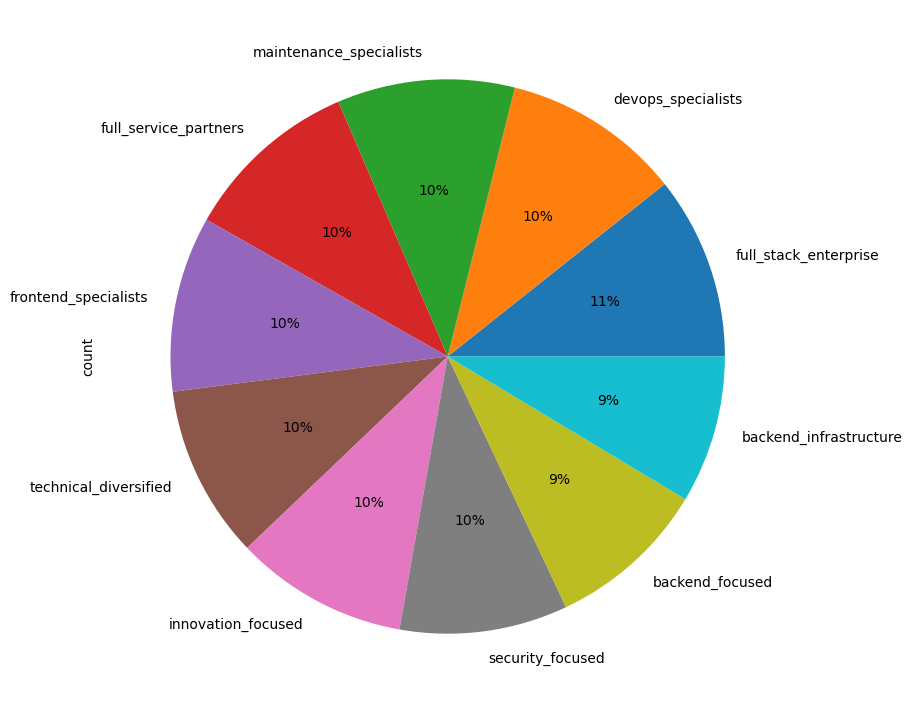

In [123]:
plt.figure(figsize=(9,9))
frame['class'].value_counts().sort_values(ascending=False).plot.pie(autopct='%1.0f%%', labels=list(frame['class'].value_counts().sort_values(ascending=False).index))
plt.show()


## Client Segment Volume Analysis:

1. Full-Service Partners (Our 'Loyal' Segment):
   - Highest number of ongoing projects
   - Validates our hypothesis about comprehensive service users
   - Represents core business foundation
   - Priority for resource allocation

2. Backend/Infrastructure Clients:
   - Second highest in project volume
   - Confirms potential for infrastructure-focused growth
   - Strong recurring revenue potential
   - Investment in backend capabilities justified

3. DevOps Specialists:
   - Lower volume but high-value segment
   - Specialized service needs
   - Opportunity for service expansion
   - Strategic capability investment needed

4. Discount-Driven Projects:
   - Lower number of clients
   - Higher discount sensitivity
   - Primarily project-based work
   - Opportunity for conversion to regular clients

Strategic Recommendations:

1. Resource Planning:
   - Focus resources on full-service and backend segments
   - Maintain specialized DevOps capabilities
   - Right-size other service teams

2. Service Portfolio:
   - Strengthen comprehensive service offerings
   - Develop backend/infrastructure packages
   - Maintain specialized capabilities
   - Consider service bundling

3. Business Development:
   - Target full-service potential clients
   - Convert project-based to long-term clients
   - Focus on high-value segments
   - Strategic discount programs
